# Proyecto Semestral Minería de datos: Predicción sobre alumnos retirados

* Javier Gálvez González
* Benjamín Martínez Gárate
* Sebastián Garrido Valenzuela

In [1]:
import csv
import pandas as pd
import numpy as np
import sklearn
%matplotlib inline
import pandas_profiling
from pandas_profiling import ProfileReport
from sklearn import preprocessing 
from sklearn import cluster
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.tree import export_text
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import ParameterGrid
from sklearn.inspection import permutation_importance
import multiprocessing
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import precision_score
from sklearn import metrics
from sklearn import svm
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn import linear_model
from sklearn.model_selection import cross_val_predict


In [2]:
from google.colab import drive
drive.mount('/content/drive/')
path = '/content/drive/My Drive'

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Para este caso, se eligen el dataset que se ocupará, donde por defecto se utilizó el dataset con los outliers ya tratados, con el fin de minimizar el impacto que tendrá en los resultados de predicción. Al ejecutar todo de forma secuencial, se tomará este mismo dataset anteriormente mencionado.

## Dataset construido originalmente

In [3]:
f = open('%s/datasetoficial.csv'%path) #se obtiene el dataset
rendimientoo = pd.read_csv(f)

In [4]:

rendimientoo

,COMUNA,CANTIDAD TOTAL DE RETIRADOS,Superficie km2,poblacion 2020,tasa de pobreza por ingresos %,Personas en hogares carentes de servicios básico %,Hogares hacinados %,cantidad de establecimientos municipales,cantidad de establecimientos particular subvencionado,cantidad de establecimientos particular pagado,cantidad de matriculas totales,Ingresos Educación (M$),Aporte Municipal al Sector Educación (M$),Gastos Educación (M$),tasa de denuncias por delito de mayon connotacion social,tasa de denuncias por violencia intrafamiliar
0,SANTIAGO,2123,22.0,503147,4.08,0.19,18.5,44,66,17,81529,68086543,8810430,68467876,21169.7,1283.0
1,RECOLETA,713,16.0,190075,6.89,13.10,19.1,19,43,2,31426,23125862,2767600,23880193,7335.6,859.9
2,INDEPENDENCIA,402,7.0,142065,8.50,6.00,20.0,9,25,3,20149,11430455,162370,10658897,8697.2,1520.3
3,QUINTA NORMAL,58,13.0,136368,3.73,9.10,18.2,2,49,0,17584,21182891,1671736,20633866,6280.4,1107.3
4,MAIPÚ,11,135.5,578605,2.57,2.90,11.3,0,163,13,81309,44285876,3900000,44979840,868.7,197.4
5,ESTACIÓN CENTRAL,432,15.0,206792,5.81,14.70,17.1,15,40,3,25562,19921456,3913500,20474710,8510.8,821.2
6,CERRILLOS,31,21.0,88956,6.48,6.00,15.8,9,24,1,12914,8247485,892025,8213170,5336.8,973.6
7,QUILICURA,4,58.0,254694,5.68,2.70,15.8,12,46,3,44225,21117885,3500000,19690246,1775.4,406.7
8,EL BOSQUE,292,14.2,172000,9.58,5.50,17.3,21,71,1,38293,18899970,177500,18743472,2539.9,516.2
9,LA CISTERNA,119,10.0,100434,6.60,20.10,16.6,8,54,2,28318,6930984,195551,7251887,6186.6,630.0


In [5]:
rendimientoo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26 entries, 0 to 25
Data columns (total 16 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   COMUNA                                                    26 non-null     object 
 1   CANTIDAD TOTAL DE RETIRADOS                               26 non-null     int64  
 2   Superficie km2                                            26 non-null     float64
 3   poblacion 2020                                            26 non-null     int64  
 4   tasa de pobreza por ingresos %                            26 non-null     float64
 5   Personas en hogares carentes de servicios básico %        26 non-null     float64
 6   Hogares hacinados %                                       26 non-null     float64
 7   cantidad de establecimientos municipales                  26 non-null     int64  
 8   cantidad de establecim

###Histograma

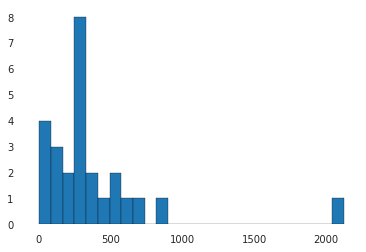

In [6]:
plt.hist(x = rendimientoo['CANTIDAD TOTAL DE RETIRADOS'], bins=26, edgecolor = 'black')
plt.show()

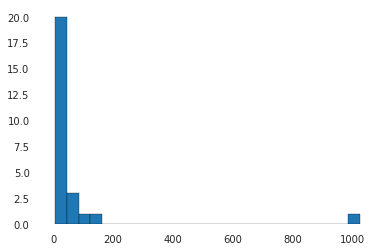

In [7]:
plt.hist(x = rendimientoo['Superficie km2'], bins=26, edgecolor = 'black')
plt.show()

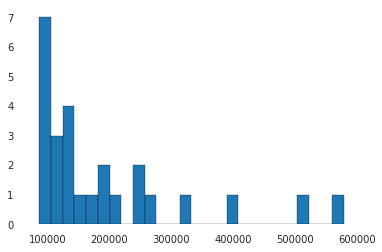

In [8]:
plt.hist(x = rendimientoo['poblacion 2020'], bins=26, edgecolor = 'black')
plt.show()

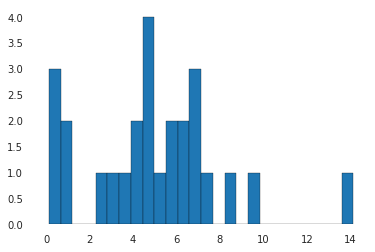

In [9]:
plt.hist(x = rendimientoo['tasa de pobreza por ingresos %'], bins=26, edgecolor = 'black')
plt.show()

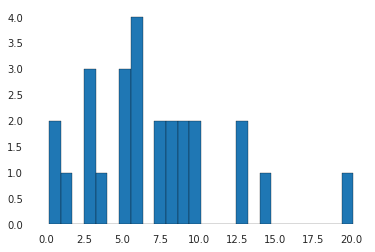

In [10]:
plt.hist(x = rendimientoo['Personas en hogares carentes de servicios básico %'], bins=26, edgecolor = 'black')
plt.show()

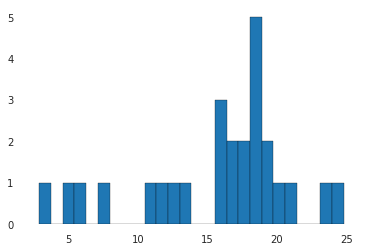

In [11]:
plt.hist(x = rendimientoo['Hogares hacinados %'], bins=26, edgecolor = 'black')
plt.show()

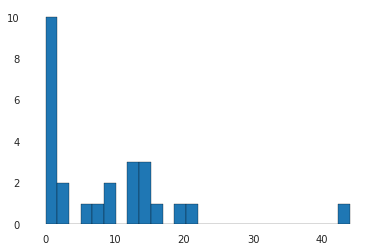

In [12]:
plt.hist(x = rendimientoo['cantidad de establecimientos municipales'], bins=26, edgecolor = 'black')
plt.show()

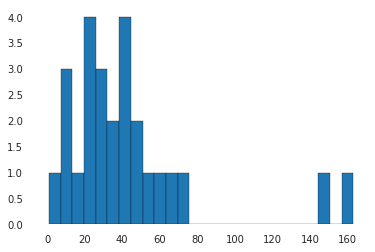

In [13]:
plt.hist(x = rendimientoo['cantidad de establecimientos particular subvencionado'], bins=26, edgecolor = 'black')
plt.show()

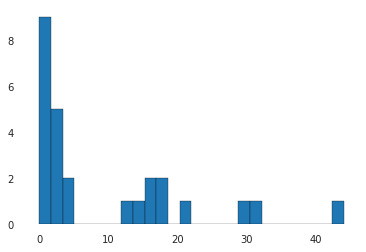

In [14]:
plt.hist(x = rendimientoo['cantidad de establecimientos particular pagado'], bins=26, edgecolor = 'black')
plt.show()

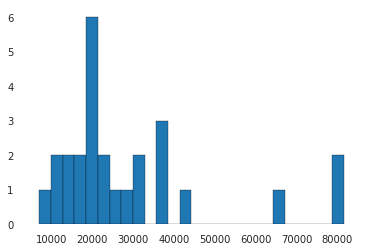

In [15]:
plt.hist(x = rendimientoo['cantidad de matriculas totales'], bins=26, edgecolor = 'black')
plt.show()

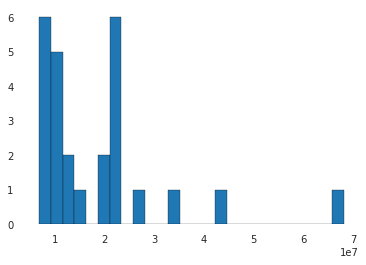

In [16]:
plt.hist(x = rendimientoo['Ingresos Educación (M$)'], bins=26, edgecolor = 'black')
plt.show()

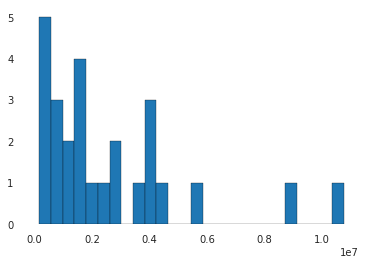

In [17]:
plt.hist(x = rendimientoo['Aporte Municipal al Sector Educación (M$)'], bins=26, edgecolor = 'black')
plt.show()

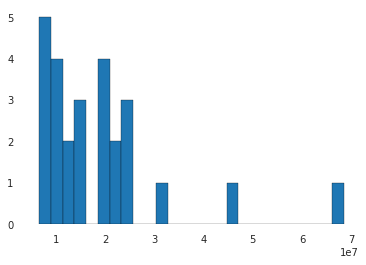

In [18]:
plt.hist(x = rendimientoo['Gastos Educación (M$)'], bins=26, edgecolor = 'black')
plt.show()

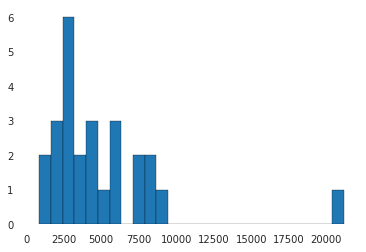

In [19]:
plt.hist(x = rendimientoo['tasa de denuncias por delito de mayon connotacion social'], bins=26, edgecolor = 'black')
plt.show()

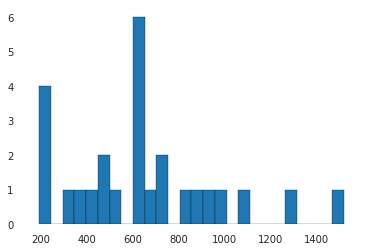

In [20]:
plt.hist(x = rendimientoo['tasa de denuncias por violencia intrafamiliar'], bins=26, edgecolor = 'black')
plt.show()

### Boxplot


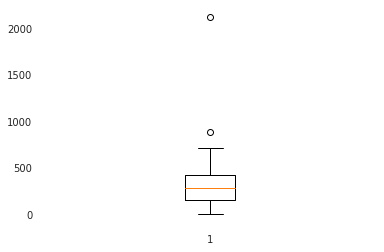

In [21]:
plt.boxplot(rendimientoo['CANTIDAD TOTAL DE RETIRADOS'])
plt.show()

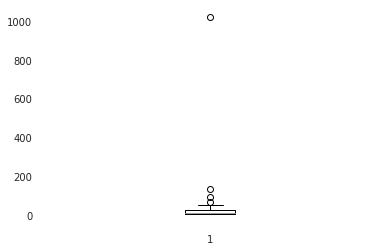

In [22]:
plt.boxplot(rendimientoo['Superficie km2'])
plt.show()

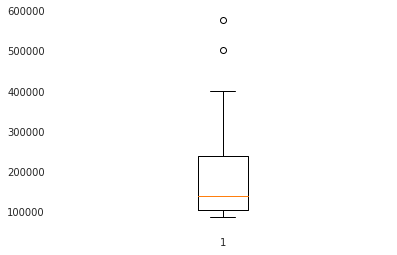

In [23]:
plt.boxplot(rendimientoo['poblacion 2020'])
plt.show()

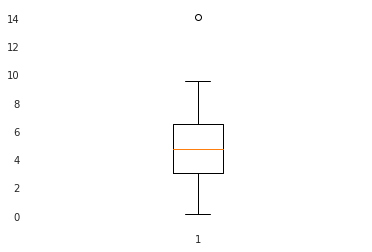

In [24]:
plt.boxplot(rendimientoo['tasa de pobreza por ingresos %'])
plt.show()

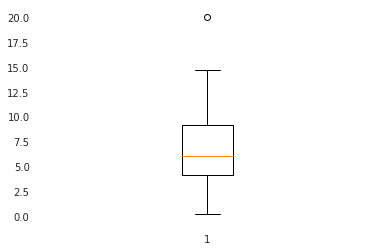

In [25]:
plt.boxplot(rendimientoo['Personas en hogares carentes de servicios básico %'])
plt.show()

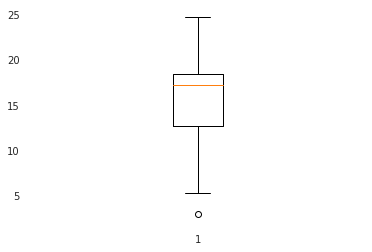

In [26]:
plt.boxplot(rendimientoo['Hogares hacinados %'])
plt.show()

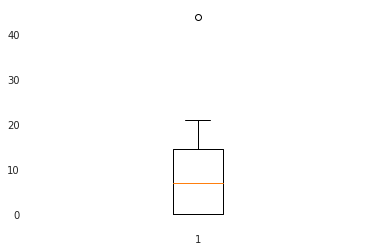

In [27]:
plt.boxplot(rendimientoo['cantidad de establecimientos municipales'])
plt.show()

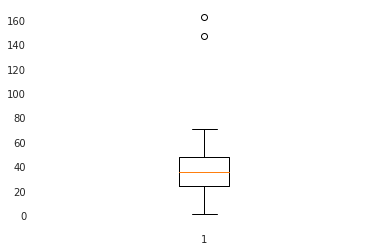

In [28]:
plt.boxplot(rendimientoo['cantidad de establecimientos particular subvencionado'])
plt.show()

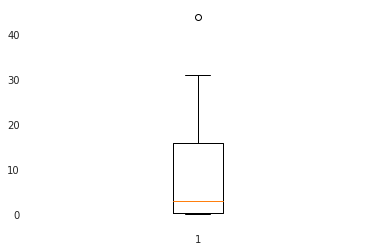

In [29]:
plt.boxplot(rendimientoo['cantidad de establecimientos particular pagado'])
plt.show()

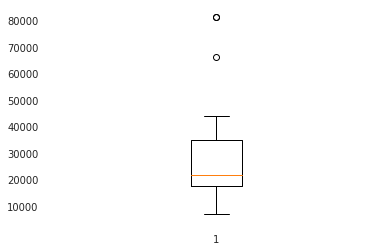

In [30]:
plt.boxplot(rendimientoo['cantidad de matriculas totales'])
plt.show()

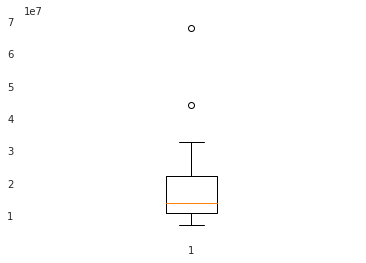

In [31]:
plt.boxplot(rendimientoo['Ingresos Educación (M$)'])
plt.show()

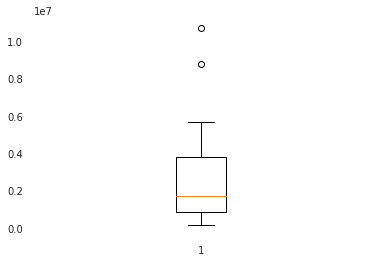

In [32]:
plt.boxplot(rendimientoo['Aporte Municipal al Sector Educación (M$)'])
plt.show()

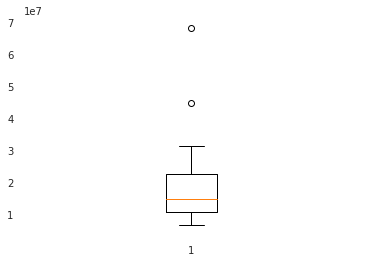

In [33]:
plt.boxplot(rendimientoo['Gastos Educación (M$)'])
plt.show()

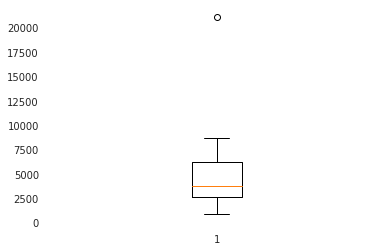

In [34]:
plt.boxplot(rendimientoo['tasa de denuncias por delito de mayon connotacion social'])
plt.show()

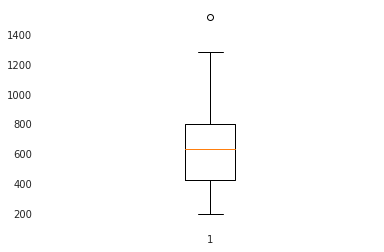

In [35]:
plt.boxplot(rendimientoo['tasa de denuncias por violencia intrafamiliar'])
plt.show()

## Dataset con los outliers ya tratados

In [36]:
fn = open('%s/datasetoutliersoficial.csv'%path) #se obtiene el nuevo dataset modificando los outliers
rendimientot = pd.read_csv(fn)

In [37]:
rendimientot

,COMUNA,CANTIDAD TOTAL DE RETIRADOS,Superficie km2,poblacion 2020,tasa de pobreza por ingresos %,Personas en hogares carentes de servicios básico %,Hogares hacinados %,cantidad de establecimientos municipales,cantidad de establecimientos particular subvencionado,cantidad de establecimientos particular pagado,cantidad de matriculas totales,Ingresos Educación (M$),Aporte Municipal al Sector Educación (M$),Gastos Educación (M$),tasa de denuncias por delito de mayon connotacion social,tasa de denuncias por violencia intrafamiliar
0,SANTIAGO,2123,22.0,188907,4.08,0.19,18.5,8.4,66,17,81529,18816072,2611578,18956753,4989.3,1283.0
1,RECOLETA,713,16.0,190075,6.89,13.10,19.1,19.0,43,2,31426,23125862,2767600,23880193,7335.6,859.9
2,INDEPENDENCIA,402,7.0,142065,8.50,6.00,20.0,9.0,25,3,20149,11430455,162370,10658897,8697.2,644.3
3,QUINTA NORMAL,58,13.0,136368,3.73,9.10,18.2,2.0,49,0,17584,21182891,1671736,20633866,6280.4,1107.3
4,MAIPÚ,11,66.9,188907,2.57,2.90,11.3,0.0,43,13,81309,18816072,3900000,18956753,868.7,197.4
5,ESTACIÓN CENTRAL,432,15.0,206792,5.81,14.70,17.1,15.0,40,3,25562,19921456,3913500,20474710,8510.8,821.2
6,CERRILLOS,31,21.0,88956,6.48,6.00,15.8,9.0,24,1,12914,8247485,892025,8213170,5336.8,973.6
7,QUILICURA,4,58.0,254694,5.68,2.70,15.8,12.0,46,3,44225,21117885,3500000,19690246,1775.4,406.7
8,EL BOSQUE,292,14.2,172000,9.58,5.50,17.3,21.0,71,1,38293,18899970,177500,18743472,2539.9,516.2
9,LA CISTERNA,119,10.0,100434,6.60,7.10,16.6,8.0,54,2,28318,6930984,195551,7251887,6186.6,630.0


In [38]:
rendimientot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26 entries, 0 to 25
Data columns (total 16 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   COMUNA                                                    26 non-null     object 
 1   CANTIDAD TOTAL DE RETIRADOS                               26 non-null     int64  
 2   Superficie km2                                            26 non-null     float64
 3   poblacion 2020                                            26 non-null     int64  
 4   tasa de pobreza por ingresos %                            26 non-null     float64
 5   Personas en hogares carentes de servicios básico %        26 non-null     float64
 6   Hogares hacinados %                                       26 non-null     float64
 7   cantidad de establecimientos municipales                  26 non-null     float64
 8   cantidad de establecim

###bloxplot tratado


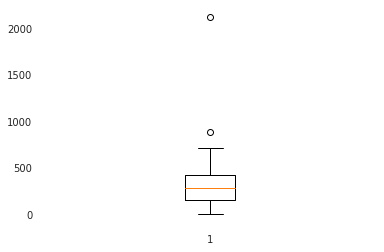

In [39]:
plt.boxplot(rendimientot['CANTIDAD TOTAL DE RETIRADOS'])
plt.show()

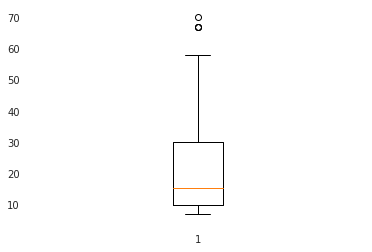

In [40]:
plt.boxplot(rendimientot['Superficie km2'])
plt.show()

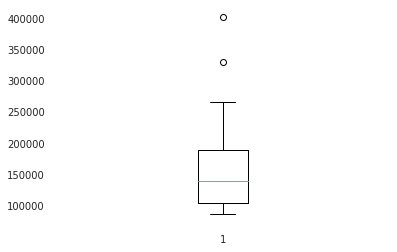

In [41]:
plt.boxplot(rendimientot['poblacion 2020'])
plt.show()

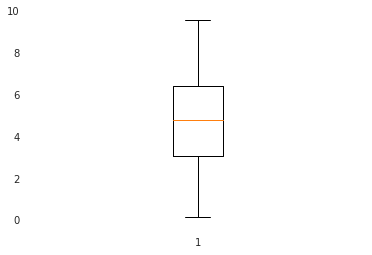

In [42]:
plt.boxplot(rendimientot['tasa de pobreza por ingresos %'])
plt.show()

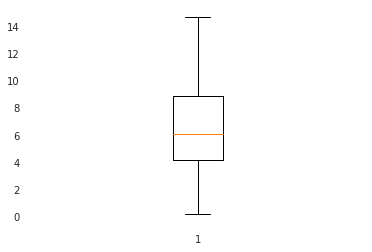

In [43]:
plt.boxplot(rendimientot['Personas en hogares carentes de servicios básico %'])
plt.show()

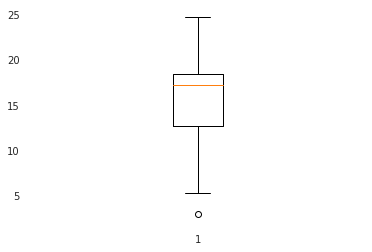

In [44]:
plt.boxplot(rendimientot['Hogares hacinados %'])
plt.show()

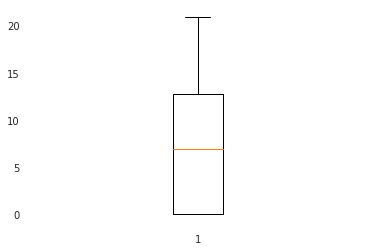

In [45]:
plt.boxplot(rendimientot['cantidad de establecimientos municipales'])
plt.show()

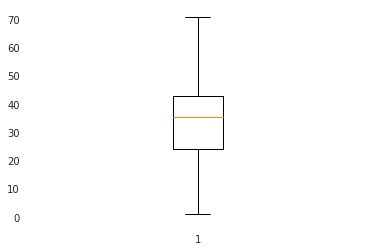

In [46]:
plt.boxplot(rendimientot['cantidad de establecimientos particular subvencionado'])
plt.show()

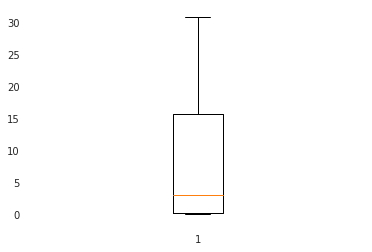

In [47]:
plt.boxplot(rendimientot['cantidad de establecimientos particular pagado'])
plt.show()

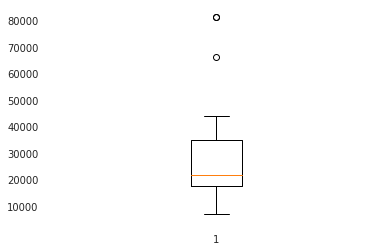

In [48]:
plt.boxplot(rendimientot['cantidad de matriculas totales'])
plt.show()

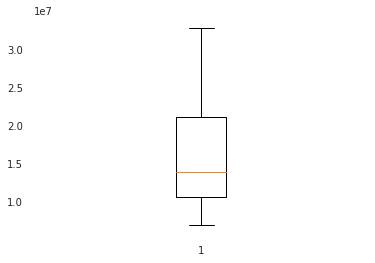

In [49]:
plt.boxplot(rendimientot['Ingresos Educación (M$)'])
plt.show()

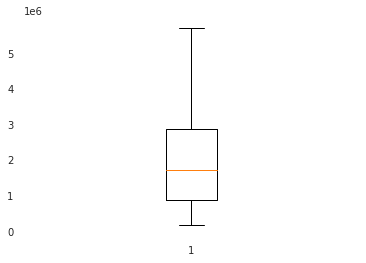

In [50]:
plt.boxplot(rendimientot['Aporte Municipal al Sector Educación (M$)'])
plt.show()

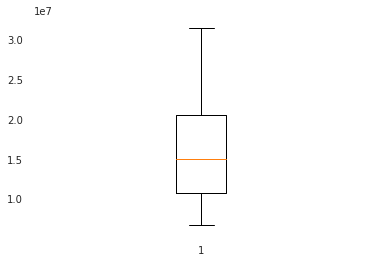

In [51]:
plt.boxplot(rendimientot['Gastos Educación (M$)'])
plt.show()

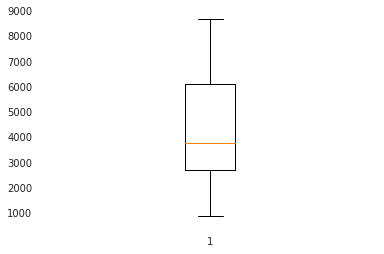

In [52]:
plt.boxplot(rendimientot['tasa de denuncias por delito de mayon connotacion social'])
plt.show()

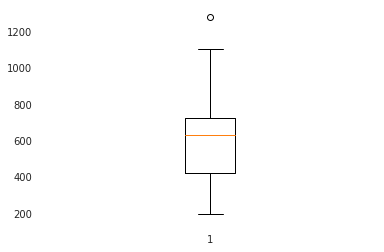

In [53]:
plt.boxplot(rendimientot['tasa de denuncias por violencia intrafamiliar'])
plt.show()

# Análisis exploratorio de datos y resumen estadístico

In [54]:
!pip install pandas-profiling==2.8.0

In [55]:
rendimientoo.describe()

,CANTIDAD TOTAL DE RETIRADOS,Superficie km2,poblacion 2020,tasa de pobreza por ingresos %,Personas en hogares carentes de servicios básico %,Hogares hacinados %,cantidad de establecimientos municipales,cantidad de establecimientos particular subvencionado,cantidad de establecimientos particular pagado,cantidad de matriculas totales,Ingresos Educación (M$),Aporte Municipal al Sector Educación (M$),Gastos Educación (M$),tasa de denuncias por delito de mayon connotacion social,tasa de denuncias por violencia intrafamiliar
count,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,2.600000e+01,2.600000e+01,2.600000e+01,26.000000,26.000000
mean,378.269231,66.869231,195516.076923,4.930769,7.061154,15.596154,8.384615,43.076923,9.423077,29236.615385,1.881607e+07,2.611578e+06,1.895675e+07,4989.334615,644.296154
std,416.096677,197.689346,129042.959903,3.168674,4.589723,5.447236,10.135391,37.333013,11.876609,19675.390914,1.336517e+07,2.614291e+06,1.337046e+07,4054.570376,330.333837
min,4.000000,7.000000,86510.000000,0.130000,0.190000,2.900000,0.000000,1.000000,0.000000,7022.000000,6.930984e+06,1.623700e+05,6.658703e+06,868.700000,193.400000
25%,163.000000,10.000000,104849.500000,3.062500,4.200000,12.700000,0.000000,24.250000,0.250000,17897.500000,1.068189e+07,8.755062e+05,1.072232e+07,2701.500000,421.850000
50%,286.500000,15.500000,139216.500000,4.800000,6.100000,17.200000,7.000000,35.500000,3.000000,21702.000000,1.393831e+07,1.733466e+06,1.505666e+07,3795.750000,629.750000
75%,424.500000,30.025000,239342.000000,6.570000,9.175000,18.425000,14.500000,48.250000,16.000000,34978.750000,2.231339e+07,3.800000e+06,2.286784e+07,6256.950000,799.000000
max,2123.000000,1024.000000,578605.000000,14.140000,20.100000,24.800000,44.000000,163.000000,44.000000,81529.000000,6.808654e+07,1.074911e+07,6.846788e+07,21169.700000,1520.300000


In [56]:
profile = ProfileReport(rendimientoo) 
#se obtienen informacion sobre cada variable, como promedio, varianza, correlacion de person, entre otros
profile

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Normalización de datos

EJECUTAR SOLO 1, A o B

## A- dataset sin tratamiento de outliers


In [57]:
b=rendimientoo.copy() #se realiza una copia del dataset

In [58]:
b.drop('COMUNA',axis=1, inplace=True) # se elimina la columna "comuna"

In [59]:
b

,CANTIDAD TOTAL DE RETIRADOS,Superficie km2,poblacion 2020,tasa de pobreza por ingresos %,Personas en hogares carentes de servicios básico %,Hogares hacinados %,cantidad de establecimientos municipales,cantidad de establecimientos particular subvencionado,cantidad de establecimientos particular pagado,cantidad de matriculas totales,Ingresos Educación (M$),Aporte Municipal al Sector Educación (M$),Gastos Educación (M$),tasa de denuncias por delito de mayon connotacion social,tasa de denuncias por violencia intrafamiliar
0,2123,22.0,503147,4.08,0.19,18.5,44,66,17,81529,68086543,8810430,68467876,21169.7,1283.0
1,713,16.0,190075,6.89,13.10,19.1,19,43,2,31426,23125862,2767600,23880193,7335.6,859.9
2,402,7.0,142065,8.50,6.00,20.0,9,25,3,20149,11430455,162370,10658897,8697.2,1520.3
3,58,13.0,136368,3.73,9.10,18.2,2,49,0,17584,21182891,1671736,20633866,6280.4,1107.3
4,11,135.5,578605,2.57,2.90,11.3,0,163,13,81309,44285876,3900000,44979840,868.7,197.4
5,432,15.0,206792,5.81,14.70,17.1,15,40,3,25562,19921456,3913500,20474710,8510.8,821.2
6,31,21.0,88956,6.48,6.00,15.8,9,24,1,12914,8247485,892025,8213170,5336.8,973.6
7,4,58.0,254694,5.68,2.70,15.8,12,46,3,44225,21117885,3500000,19690246,1775.4,406.7
8,292,14.2,172000,9.58,5.50,17.3,21,71,1,38293,18899970,177500,18743472,2539.9,516.2
9,119,10.0,100434,6.60,20.10,16.6,8,54,2,28318,6930984,195551,7251887,6186.6,630.0


In [60]:

# Se divide la matriz del dataset en dos partes
# la submatriz variables_independientes contiene los valores de las primeras 17 columnas del dataframe y todas las filas
variables_independientes = b.iloc[:,1:15]
# El vector variable_objetivo contiene los valores de la primera columnas para todas las filas
variable_objetivo = b.iloc[:,0:1]
#X

In [61]:
variable_objetivo

,CANTIDAD TOTAL DE RETIRADOS
0,2123
1,713
2,402
3,58
4,11
5,432
6,31
7,4
8,292
9,119


In [62]:
variables_independientes

,Superficie km2,poblacion 2020,tasa de pobreza por ingresos %,Personas en hogares carentes de servicios básico %,Hogares hacinados %,cantidad de establecimientos municipales,cantidad de establecimientos particular subvencionado,cantidad de establecimientos particular pagado,cantidad de matriculas totales,Ingresos Educación (M$),Aporte Municipal al Sector Educación (M$),Gastos Educación (M$),tasa de denuncias por delito de mayon connotacion social,tasa de denuncias por violencia intrafamiliar
0,22.0,503147,4.08,0.19,18.5,44,66,17,81529,68086543,8810430,68467876,21169.7,1283.0
1,16.0,190075,6.89,13.10,19.1,19,43,2,31426,23125862,2767600,23880193,7335.6,859.9
2,7.0,142065,8.50,6.00,20.0,9,25,3,20149,11430455,162370,10658897,8697.2,1520.3
3,13.0,136368,3.73,9.10,18.2,2,49,0,17584,21182891,1671736,20633866,6280.4,1107.3
4,135.5,578605,2.57,2.90,11.3,0,163,13,81309,44285876,3900000,44979840,868.7,197.4
5,15.0,206792,5.81,14.70,17.1,15,40,3,25562,19921456,3913500,20474710,8510.8,821.2
6,21.0,88956,6.48,6.00,15.8,9,24,1,12914,8247485,892025,8213170,5336.8,973.6
7,58.0,254694,5.68,2.70,15.8,12,46,3,44225,21117885,3500000,19690246,1775.4,406.7
8,14.2,172000,9.58,5.50,17.3,21,71,1,38293,18899970,177500,18743472,2539.9,516.2
9,10.0,100434,6.60,20.10,16.6,8,54,2,28318,6930984,195551,7251887,6186.6,630.0


## B- dataset con tratamiento de outliers


In [63]:
b=rendimientot.copy() #se realiza una copia del dataset

In [64]:
b.drop('COMUNA',axis=1, inplace=True) # se elimina la columna "comuna"

In [65]:
b

,CANTIDAD TOTAL DE RETIRADOS,Superficie km2,poblacion 2020,tasa de pobreza por ingresos %,Personas en hogares carentes de servicios básico %,Hogares hacinados %,cantidad de establecimientos municipales,cantidad de establecimientos particular subvencionado,cantidad de establecimientos particular pagado,cantidad de matriculas totales,Ingresos Educación (M$),Aporte Municipal al Sector Educación (M$),Gastos Educación (M$),tasa de denuncias por delito de mayon connotacion social,tasa de denuncias por violencia intrafamiliar
0,2123,22.0,188907,4.08,0.19,18.5,8.4,66,17,81529,18816072,2611578,18956753,4989.3,1283.0
1,713,16.0,190075,6.89,13.10,19.1,19.0,43,2,31426,23125862,2767600,23880193,7335.6,859.9
2,402,7.0,142065,8.50,6.00,20.0,9.0,25,3,20149,11430455,162370,10658897,8697.2,644.3
3,58,13.0,136368,3.73,9.10,18.2,2.0,49,0,17584,21182891,1671736,20633866,6280.4,1107.3
4,11,66.9,188907,2.57,2.90,11.3,0.0,43,13,81309,18816072,3900000,18956753,868.7,197.4
5,432,15.0,206792,5.81,14.70,17.1,15.0,40,3,25562,19921456,3913500,20474710,8510.8,821.2
6,31,21.0,88956,6.48,6.00,15.8,9.0,24,1,12914,8247485,892025,8213170,5336.8,973.6
7,4,58.0,254694,5.68,2.70,15.8,12.0,46,3,44225,21117885,3500000,19690246,1775.4,406.7
8,292,14.2,172000,9.58,5.50,17.3,21.0,71,1,38293,18899970,177500,18743472,2539.9,516.2
9,119,10.0,100434,6.60,7.10,16.6,8.0,54,2,28318,6930984,195551,7251887,6186.6,630.0


In [66]:

# Se divide la matriz del dataset en dos partes
# la submatriz variables_independientes contiene los valores de las primeras 17 columnas del dataframe y todas las filas
variables_independientes = b.iloc[:,1:15]
# El vector variable_objetivo contiene los valores de la primera columnas para todas las filas
variable_objetivo = b.iloc[:,0:1]
#X

In [67]:
variable_objetivo

,CANTIDAD TOTAL DE RETIRADOS
0,2123
1,713
2,402
3,58
4,11
5,432
6,31
7,4
8,292
9,119


In [68]:
variables_independientes

,Superficie km2,poblacion 2020,tasa de pobreza por ingresos %,Personas en hogares carentes de servicios básico %,Hogares hacinados %,cantidad de establecimientos municipales,cantidad de establecimientos particular subvencionado,cantidad de establecimientos particular pagado,cantidad de matriculas totales,Ingresos Educación (M$),Aporte Municipal al Sector Educación (M$),Gastos Educación (M$),tasa de denuncias por delito de mayon connotacion social,tasa de denuncias por violencia intrafamiliar
0,22.0,188907,4.08,0.19,18.5,8.4,66,17,81529,18816072,2611578,18956753,4989.3,1283.0
1,16.0,190075,6.89,13.10,19.1,19.0,43,2,31426,23125862,2767600,23880193,7335.6,859.9
2,7.0,142065,8.50,6.00,20.0,9.0,25,3,20149,11430455,162370,10658897,8697.2,644.3
3,13.0,136368,3.73,9.10,18.2,2.0,49,0,17584,21182891,1671736,20633866,6280.4,1107.3
4,66.9,188907,2.57,2.90,11.3,0.0,43,13,81309,18816072,3900000,18956753,868.7,197.4
5,15.0,206792,5.81,14.70,17.1,15.0,40,3,25562,19921456,3913500,20474710,8510.8,821.2
6,21.0,88956,6.48,6.00,15.8,9.0,24,1,12914,8247485,892025,8213170,5336.8,973.6
7,58.0,254694,5.68,2.70,15.8,12.0,46,3,44225,21117885,3500000,19690246,1775.4,406.7
8,14.2,172000,9.58,5.50,17.3,21.0,71,1,38293,18899970,177500,18743472,2539.9,516.2
9,10.0,100434,6.60,7.10,16.6,8.0,54,2,28318,6930984,195551,7251887,6186.6,630.0


## Posteriormente a eso, se debe ejecutar una de las ramas para normalizar los datos, es importante elegir uno solo, si se ejecuta de forma secuencial por defecto se tomará la última rama. Se comprobaron diferentes normalizaciones como MinMaxScaler, scale y normalize, donde se determino la mas apropiada al proyecto.

## Rama 1: Sin normalizar

In [69]:
X_std = variables_independientes.values

In [70]:
X_stdo = variable_objetivo.values

In [71]:
X_std

array([[2.2000000e+01, 1.8890700e+05, 4.0800000e+00, 1.9000000e-01,
        1.8500000e+01, 8.4000000e+00, 6.6000000e+01, 1.7000000e+01,
        8.1529000e+04, 1.8816072e+07, 2.6115780e+06, 1.8956753e+07,
        4.9893000e+03, 1.2830000e+03],
       [1.6000000e+01, 1.9007500e+05, 6.8900000e+00, 1.3100000e+01,
        1.9100000e+01, 1.9000000e+01, 4.3000000e+01, 2.0000000e+00,
        3.1426000e+04, 2.3125862e+07, 2.7676000e+06, 2.3880193e+07,
        7.3356000e+03, 8.5990000e+02],
       [7.0000000e+00, 1.4206500e+05, 8.5000000e+00, 6.0000000e+00,
        2.0000000e+01, 9.0000000e+00, 2.5000000e+01, 3.0000000e+00,
        2.0149000e+04, 1.1430455e+07, 1.6237000e+05, 1.0658897e+07,
        8.6972000e+03, 6.4430000e+02],
       [1.3000000e+01, 1.3636800e+05, 3.7300000e+00, 9.1000000e+00,
        1.8200000e+01, 2.0000000e+00, 4.9000000e+01, 0.0000000e+00,
        1.7584000e+04, 2.1182891e+07, 1.6717360e+06, 2.0633866e+07,
        6.2804000e+03, 1.1073000e+03],
       [6.6900000e+01, 1.889

In [72]:
X_stdo

array([[2123],
       [ 713],
       [ 402],
       [  58],
       [  11],
       [ 432],
       [  31],
       [   4],
       [ 292],
       [ 119],
       [ 885],
       [ 281],
       [ 265],
       [ 214],
       [ 322],
       [ 157],
       [ 181],
       [ 300],
       [ 584],
       [ 270],
       [ 531],
       [ 296],
       [ 267],
       [ 394],
       [ 569],
       [ 134]])

## Rama 2: Normalize

In [73]:
X_std = preprocessing.normalize(variables_independientes)

In [74]:
X_stdo = preprocessing.normalize(variable_objetivo)

In [75]:
X_std

array([[8.19740324e-07, 7.03884934e-03, 1.52024569e-07, 7.07957553e-09,
        6.89327091e-07, 3.12991760e-07, 2.45922097e-06, 6.33435705e-07,
        3.03784586e-03, 7.01104226e-01, 9.73098090e-02, 7.06346130e-01,
        1.85905927e-04, 4.78057653e-05],
       [4.79642966e-07, 5.69800855e-03, 2.06546252e-07, 3.92707679e-07,
        5.72573791e-07, 5.69576022e-07, 1.28904047e-06, 5.99553708e-08,
        9.42078741e-04, 6.93259815e-01, 8.29662421e-02, 7.15872913e-01,
        2.19904309e-04, 2.57778117e-05],
       [4.47840632e-07, 9.08892562e-03, 5.43806481e-07, 3.83863399e-07,
        1.27954466e-06, 5.75795098e-07, 1.59943083e-06, 1.91931699e-07,
        1.28907727e-03, 7.31288884e-01, 1.03879833e-02, 6.81926738e-01,
        5.56422792e-04, 4.12205313e-05],
       [4.38907512e-07, 4.60407228e-03, 1.25932694e-07, 3.07235259e-07,
        6.14470517e-07, 6.75242326e-08, 1.65434370e-06, 0.00000000e+00,
        5.93673053e-04, 7.15179230e-01, 5.64413453e-02, 6.96642984e-01,
        2.120

In [76]:
X_stdo

array([[1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]])

## Rama 3: MinMaxScaler

In [77]:
X_std = preprocessing.minmax_scale(variables_independientes)

In [78]:
X_stdo = preprocessing.minmax_scale(variable_objetivo)

In [79]:
X_std

array([[0.23734177, 0.32412012, 0.41798942, 0.        , 0.71232877,
        0.4       , 0.92857143, 0.5483871 , 1.        , 0.4579091 ,
        0.44087955, 0.49380777, 0.52635882, 1.        ],
       [0.14240506, 0.32781722, 0.71534392, 0.88973122, 0.73972603,
        0.9047619 , 0.6       , 0.06451613, 0.32753969, 0.62395685,
        0.46896491, 0.69150033, 0.82607141, 0.61169236],
       [0.        , 0.17584981, 0.88571429, 0.40041351, 0.78082192,
        0.42857143, 0.34285714, 0.09677419, 0.17618479, 0.17335578,
        0.        , 0.16062115, 1.        , 0.41382159],
       [0.09493671, 0.15781694, 0.38095238, 0.61405927, 0.69863014,
        0.0952381 , 0.68571429, 0.        , 0.14175849, 0.54909799,
        0.2716995 , 0.56114946, 0.69128185, 0.83874816],
       [0.94778481, 0.32412012, 0.25820106, 0.18676775, 0.38356164,
        0.        , 0.6       , 0.41935484, 0.99704726, 0.4579091 ,
        0.67280713, 0.49380777, 0.        , 0.00367107],
       [0.12658228, 0.38073201, 0.6

In [80]:
X_stdo

array([[1.        ],
       [0.33459179],
       [0.18782445],
       [0.02548372],
       [0.00330345],
       [0.20198207],
       [0.01274186],
       [0.        ],
       [0.13591317],
       [0.05427088],
       [0.41576215],
       [0.13072204],
       [0.12317131],
       [0.09910335],
       [0.15007079],
       [0.07220387],
       [0.08352997],
       [0.13968853],
       [0.27371402],
       [0.12553091],
       [0.24870222],
       [0.13780085],
       [0.12411515],
       [0.18404908],
       [0.26663521],
       [0.06134969]])

## Rama 4: Scale 

In [81]:
X_std = preprocessing.scale(variables_independientes) # Se considera como la normalización con mejor resultado

In [82]:
X_stdo = preprocessing.scale(variable_objetivo) # Se considera como la normalización con mejor resultado

In [83]:
X_std

array([[-1.93586118e-01,  2.64261514e-01, -1.98347042e-01,
        -1.73616425e+00,  5.43643311e-01,  1.99615924e-01,
         1.82880876e+00,  9.52067825e-01,  2.71038975e+00,
         4.27692414e-01,  3.68189294e-01,  4.42392539e-01,
         2.69024391e-01,  2.46722042e+00],
       [-4.71154448e-01,  2.79343384e-01,  9.24134358e-01,
         1.78186105e+00,  6.55972259e-01,  1.72778672e+00,
         4.95116519e-01, -6.48391018e-01,  1.13478964e-01,
         1.06891135e+00,  4.72370873e-01,  1.19212470e+00,
         1.28336415e+00,  9.14741344e-01],
       [-8.87506944e-01, -3.40588653e-01,  1.56726427e+00,
        -1.52916609e-01,  8.24465683e-01,  2.86116158e-01,
        -5.48642629e-01, -5.41693762e-01, -4.71024219e-01,
        -6.71154051e-01, -1.26723619e+00, -8.21189328e-01,
         1.87200372e+00,  1.23641158e-01],
       [-6.09938613e-01, -4.14151511e-01, -3.38157892e-01,
         6.91845468e-01,  4.87478836e-01, -7.23053236e-01,
         8.43036235e-01, -8.61785531e-01, -6.

In [84]:
X_stdo

array([[ 4.27612943],
       [ 0.82038565],
       [ 0.05816132],
       [-0.78494213],
       [-0.90013359],
       [ 0.13168778],
       [-0.85111595],
       [-0.91728976],
       [-0.21143571],
       [-0.63543832],
       [ 1.24193738],
       [-0.23839542],
       [-0.27760953],
       [-0.40260452],
       [-0.13790925],
       [-0.5423048 ],
       [-0.48348363],
       [-0.19182866],
       [ 0.50422186],
       [-0.26535512],
       [ 0.37432511],
       [-0.20163219],
       [-0.27270777],
       [ 0.03855426],
       [ 0.46745863],
       [-0.59867509]])

# Aplicacion de Clustering

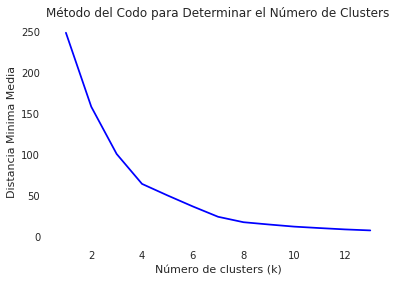

In [85]:
distortions = []
K = range(1,14)
for k in K:
    kmeanModel = cluster.KMeans(n_clusters=k).fit(b[[ 'CANTIDAD TOTAL DE RETIRADOS']])
    kmeanModel.fit(b[['CANTIDAD TOTAL DE RETIRADOS']])
    distortions.append(sum(np.min(cdist(b[['CANTIDAD TOTAL DE RETIRADOS']], kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / b[['CANTIDAD TOTAL DE RETIRADOS']].shape[0])

plt.plot(K, distortions, 'bx-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Distancia Minima Media')
plt.title('Método del Codo para Determinar el Número de Clusters')
plt.show()

Número de clusters donde se produce un gran cambio en la curva: 3

**KNN 3 GRUPOS**

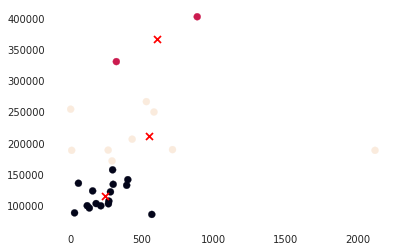

In [86]:
kmeans = cluster.KMeans(3)
kmeans.fit(b[['CANTIDAD TOTAL DE RETIRADOS', 'poblacion 2020']])
labels = kmeans.labels_
centroids3 = kmeans.cluster_centers_
plt.scatter( b['CANTIDAD TOTAL DE RETIRADOS'],b['poblacion 2020'], c=labels)
plt.scatter(centroids3[:,0], centroids3[:,1], marker='x', c='red')
plt.show()

In [87]:
# Valores de los centroides
centroids3

array([[2.44866667e+02, 1.15905867e+05],
       [6.03500000e+02, 3.66596000e+05],
       [5.50555556e+02, 2.11966667e+05]])

**KNN 4 GRUPOS**

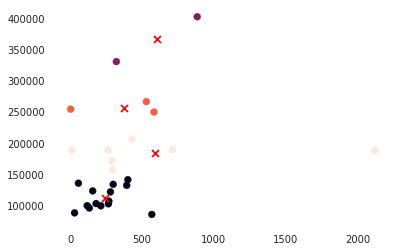

In [88]:
kmeans = cluster.KMeans(4)
kmeans.fit(b[[ 'CANTIDAD TOTAL DE RETIRADOS','poblacion 2020']])
labels = kmeans.labels_
centroids4 = kmeans.cluster_centers_
plt.scatter( b['CANTIDAD TOTAL DE RETIRADOS'],b['poblacion 2020'], c=labels)
plt.scatter(centroids4[:,0], centroids4[:,1], marker='x', c='red')
plt.show()

In [89]:
# Valores de los centroides
centroids4

array([[2.41214286e+02, 1.12917071e+05],
       [6.03500000e+02, 3.66596000e+05],
       [3.73000000e+02, 2.57228000e+05],
       [5.90285714e+02, 1.84823571e+05]])

**KNN 5 GRUPOS**

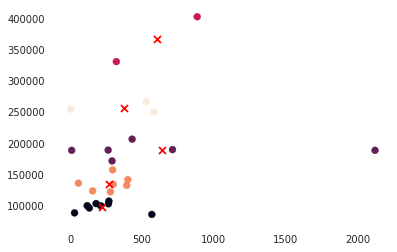

In [90]:
kmeans = cluster.KMeans(5)
kmeans.fit(b[['CANTIDAD TOTAL DE RETIRADOS', 'poblacion 2020']])
labels = kmeans.labels_
centroids5 = kmeans.cluster_centers_
plt.scatter(b['CANTIDAD TOTAL DE RETIRADOS'], b['poblacion 2020'], c=labels)
plt.scatter(centroids5[:,0], centroids5[:,1], marker='x', c='red')
plt.show()

In [91]:
# Valores de los centroides
centroids5

array([[2.23125000e+02, 9.85098750e+04],
       [6.39333333e+02, 1.89336000e+05],
       [6.03500000e+02, 3.66596000e+05],
       [2.69714286e+02, 1.35787000e+05],
       [3.73000000e+02, 2.57228000e+05]])

**KNN 6 GRUPOS**

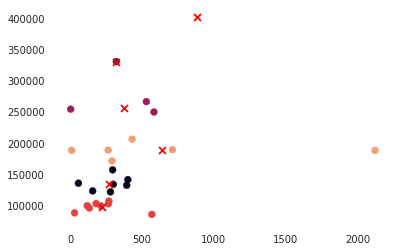

In [92]:
kmeans = cluster.KMeans(6)
kmeans.fit(b[['CANTIDAD TOTAL DE RETIRADOS','poblacion 2020']])
labels = kmeans.labels_
centroids6 = kmeans.cluster_centers_
plt.scatter(b['CANTIDAD TOTAL DE RETIRADOS'],b['poblacion 2020'], c=labels)
plt.scatter(centroids6[:,0], centroids6[:,1], marker='x', c='red')
plt.show()

In [93]:
# Valores de los centroides
centroids6

array([[2.69714286e+02, 1.35787000e+05],
       [3.22000000e+02, 3.30759000e+05],
       [3.73000000e+02, 2.57228000e+05],
       [2.23125000e+02, 9.85098750e+04],
       [6.39333333e+02, 1.89336000e+05],
       [8.85000000e+02, 4.02433000e+05]])

**KNN 7 GRUPOS**

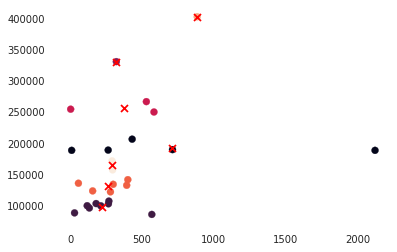

In [94]:
kmeans = cluster.KMeans(7)
kmeans.fit(b[['CANTIDAD TOTAL DE RETIRADOS','poblacion 2020']])
labels = kmeans.labels_
centroids7 = kmeans.cluster_centers_
plt.scatter(b['CANTIDAD TOTAL DE RETIRADOS'],b['poblacion 2020'], c=labels)
plt.scatter(centroids7[:,0], centroids7[:,1], marker='x', c='red')
plt.show()

Agrupamiento divisivo al total de retirados para chequear clustering.

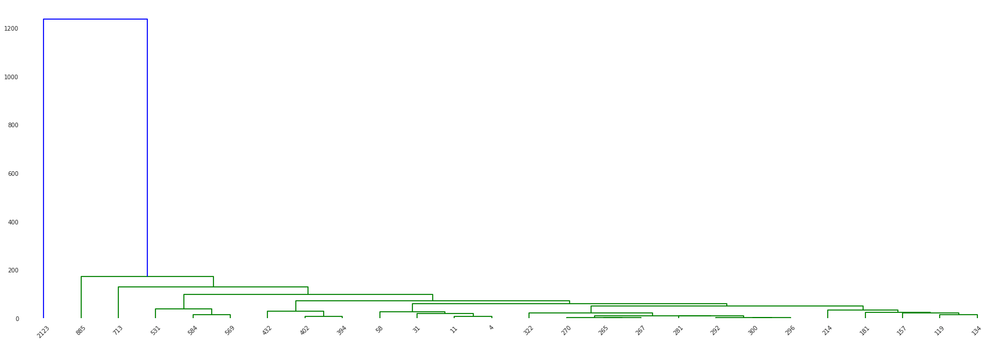

In [95]:
distancias = linkage(b[['CANTIDAD TOTAL DE RETIRADOS']].values, 'single')
etiquetas = b['CANTIDAD TOTAL DE RETIRADOS'].values

plt.figure(figsize=(30, 10))
dendrogram(distancias, orientation='top',labels = etiquetas, distance_sort='descending',show_leaf_counts=True)
plt.show() 

# Analisis PCA y Factorial

In [96]:

!pip3 install mglearn

     |████████████████████████████████| 542kB 4.6MB/s 
  Created wheel for mglearn: filename=mglearn-0.1.9-py2.py3-none-any.whl size=582638 sha256=a6eabb36a83b9883cbed303bd8807d933abcced881b4f73cb289b82d400cb05c
  Stored in directory: /root/.cache/pip/wheels/eb/a6/ea/a6a3716233fa62fc561259b5cb1e28f79e9ff3592c0adac5f0
Successfully built mglearn


In [97]:

!pip install factor_analyzer==0.2.3

In [98]:

from factor_analyzer import FactorAnalyzer
import mglearn

In [99]:

X_std.shape #variables independientes

(26, 14)

In [100]:
X_stdo.shape #variable objetivo

(26, 1)

Se calcula la matriz de covarianza

In [101]:

print('NumPy covariance matrix: \n%s' %np.cov(X_std.T))

NumPy covariance matrix: 
[[ 1.04        0.69847738 -0.40193946 -0.43758535 -0.26173057 -0.36155281
  -0.08906203  0.35582979  0.60354458  0.4334473   0.67073795  0.41228262
  -0.6314518  -0.59464088]
 [ 0.69847738  1.04       -0.19812192 -0.26824789 -0.21781672 -0.22535944
   0.2178514   0.32257053  0.60326827  0.88625378  0.55438744  0.87401183
  -0.18688653 -0.21304696]
 [-0.40193946 -0.19812192  1.04        0.47149367  0.73213907  0.66361173
   0.55303009 -0.75876562 -0.11504228 -0.2034448  -0.51751552 -0.16451218
   0.12912301  0.45740513]
 [-0.43758535 -0.26824789  0.47149367  1.04        0.55875044  0.36794017
   0.0673439  -0.4789446  -0.53499606 -0.11581088 -0.28562926 -0.04844544
   0.2622638   0.33941677]
 [-0.26173057 -0.21781672  0.73213907  0.55875044  1.04        0.64059841
   0.49696247 -0.66501213 -0.06411866 -0.1670955  -0.37475838 -0.10644227
  -0.136976    0.47234416]
 [-0.36155281 -0.22535944  0.66361173  0.36794017  0.64059841  1.04
   0.4248816  -0.61432364 -0.05

Vectores con valores eigen

In [102]:

cov_mat = np.cov(X_std.T)

eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

Eigenvectors 
[[ 0.33597163 -0.08041855 -0.35908595 -0.14331909 -0.10226136 -0.21564855
  -0.31402401 -0.03369277 -0.0216039   0.02031282 -0.6275156   0.20905761
  -0.35672757  0.09407475]
 [ 0.31360223 -0.30279759  0.05250723 -0.13662322 -0.23893674  0.20925449
  -0.2959505  -0.10283311 -0.20035732  0.01259272  0.60678646  0.13992424
  -0.40105558 -0.024269  ]
 [-0.30209703 -0.29047084 -0.09280048 -0.03729044  0.04851904  0.155656
  -0.4262117   0.53215122 -0.27869001  0.01338796 -0.03552617 -0.09586521
   0.24103811  0.4201647 ]
 [-0.25121652 -0.10259425  0.19035164 -0.60264431 -0.15839544 -0.28614335
   0.09120617  0.20784643  0.48775239 -0.05114754  0.07190082 -0.17587662
  -0.2704192   0.13681233]
 [-0.2696476  -0.30257836 -0.19262259 -0.18262215 -0.01801796 -0.39858993
   0.24769711  0.09539106 -0.5217281  -0.02262535  0.02177389  0.0640616
  -0.00390191 -0.5082568 ]
 [-0.24350293 -0.26486654 -0.146779   -0.14371193  0.67736631  0.32188602
   0.19955673 -0.28770555  0.00246462  0

In [103]:

#  lista de (autovector, autovalor) 
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Orden descendiente con la función sort
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visualizamos la lista de autovalores en orden desdenciente
print('Autovalores en orden descendiente:')
for i in eig_pairs:
    print(i[0])

Autovalores en orden descendiente:
5.651708603281223
3.2894440706942127
1.8322122785752073
1.1799383056098545
0.6340288167319386
0.5767789095331255
0.4538254158844032
0.2947241666373228
0.2503498005105968
0.12416773468432327
0.11466949470687425
0.0992010304510181
0.05201318361310276
0.006938189086800767


[38.81667996759081, 22.592335650372338, 12.583875539664882, 8.10397187918856, 4.354593521510567, 3.9613936094308064, 3.116932801403868, 2.0242044411904034, 1.7194354430672854, 0.8528003755791432, 0.7875652108988616, 0.6813257585921572, 0.3572334039361453, 0.047652397574181084] var 

[ 38.81667997  61.40901562  73.99289116  82.09686304  86.45145656
  90.41285017  93.52978297  95.55398741  97.27342285  98.12622323
  98.91378844  99.5951142   99.9523476  100.        ] cum



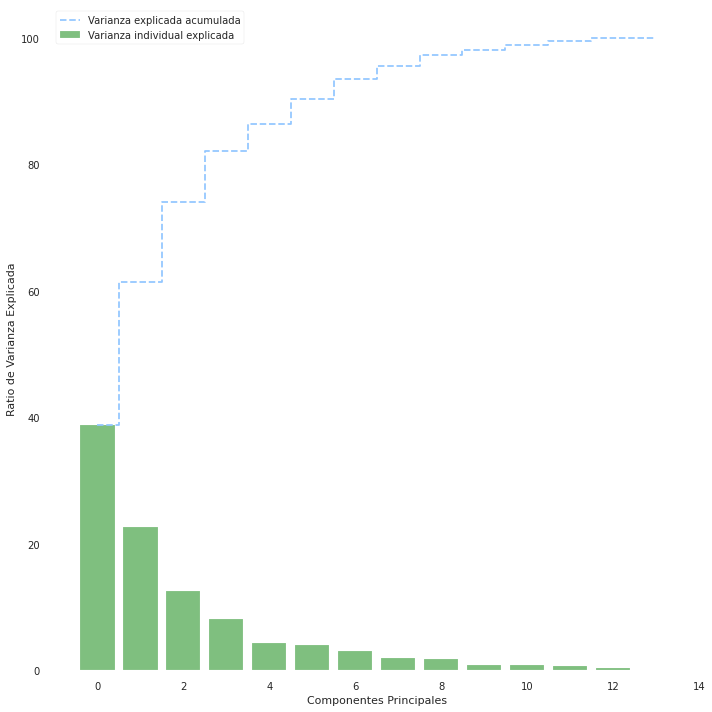

In [104]:
# A partir de los autovalores, se calcula la varianza 
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print(var_exp, 'var \n')
print(cum_var_exp, 'cum\n')
with plt.style.context('seaborn-pastel'):
     plt.figure(figsize=(10, 10))
     plt.bar(range(14), var_exp, alpha=0.5, align='center',label='Varianza individual explicada', color='g')
     plt.step(range(14), cum_var_exp, where='mid', linestyle='--', label='Varianza explicada acumulada')
     plt.ylabel('Ratio de Varianza Explicada')
     plt.xlabel('Componentes Principales')
     plt.legend(loc='best')
     plt.tight_layout()
# Representamos en un diagrama de barras la varianza por cada autovalor, y la acumulada

**PCA**

In [105]:

pca = PCA(n_components=3)
pca.fit(X_std)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [106]:
#se transforma los datos, reduciendo los componentes
transformado = pca.transform(X_std)

print(X_std.shape)
print(transformado.shape)

(26, 14)
(26, 3)


In [107]:

transformado

array([[ 0.88598931, -2.43568088,  0.56004336],
       [-1.21498401, -2.50144798,  1.64285012],
       [-2.45217358,  0.35148167,  0.7116531 ],
       [-1.07376389, -0.98787054,  1.78539334],
       [ 3.6467319 , -0.45477319, -2.06164093],
       [-0.96838314, -1.65543742,  2.11475465],
       [-2.33257554,  1.02528912, -0.02645843],
       [ 1.73769884, -1.71674371, -1.69232933],
       [-1.60744024, -2.60934419, -1.24454946],
       [-2.46851883,  0.37150727, -0.30384973],
       [ 5.1074292 , -3.16967765,  0.0409759 ],
       [-1.9964333 , -0.23156837, -0.6961107 ],
       [-0.91232437, -1.63173143, -1.6150258 ],
       [ 0.88178613,  2.77998971, -0.21421399],
       [ 4.20404129,  0.85331652, -0.58917327],
       [ 1.26881246,  2.0907878 , -2.21344035],
       [-2.41585494, -0.17541899, -0.60004229],
       [-1.39451957,  1.07909968,  0.13507797],
       [ 2.62937426,  0.63333737,  2.49575224],
       [-2.34744515,  0.09353453, -0.61922283],
       [ 1.82965703, -1.17544833, -0.288

**Analisis Factorial**

In [108]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(variables_independientes)
chi_square_value, p_value

(307.0751027392612, 1.1350358429020566e-25)

In [109]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(variables_independientes)

In [110]:
# Se crea el factor de analisis y el desempeño de este
fa = FactorAnalyzer()
fa.analyze(variables_independientes, 10, rotation=None)
# Se checkea el eigenvelues
ev, v = fa.get_eigenvalues()
ev

,Original_Eigenvalues
0,5.434335
1,3.162927
2,1.761743
3,1.134556
4,0.609643
5,0.554595
6,0.436371
7,0.283389
8,0.240721
9,0.119392


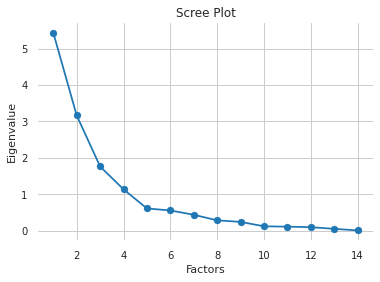

In [111]:
# Se grafica
plt.scatter(range(1,variables_independientes.shape[1]+1),ev)
plt.plot(range(1,variables_independientes.shape[1]+1),ev)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

In [112]:
# Se crea el factor de analisis y el desempeño de este usando 4 factores
fa = FactorAnalyzer()
fa.analyze(rendimientoo, 4, rotation="varimax")
fa.loadings

,Factor1,Factor2,Factor3,Factor4
CANTIDAD TOTAL DE RETIRADOS,0.377732,-0.078079,0.793007,-0.010771
Superficie km2,-0.029244,-0.088606,-0.119952,0.557692
poblacion 2020,0.926408,-0.262359,0.164818,0.051987
tasa de pobreza por ingresos %,0.004526,0.802046,0.048863,-0.109212
Personas en hogares carentes de servicios básico %,-0.324109,0.472875,-0.082901,-0.103422
Hogares hacinados %,0.005063,0.924324,0.232558,0.201201
cantidad de establecimientos municipales,0.200189,0.387867,0.705226,0.102133
cantidad de establecimientos particular subvencionado,0.893231,0.207091,-0.198411,-0.157208
cantidad de establecimientos particular pagado,0.143224,-0.892879,0.039858,0.259221
cantidad de matriculas totales,0.944361,-0.102962,0.194796,0.113412


In [113]:
# Se obtiene la varianza
fa.get_factor_variance()

,Factor1,Factor2,Factor3,Factor4
SS Loadings,4.352271,3.432154,3.142315,0.926629
Proportion Var,0.290151,0.228810,0.209488,0.061775
Cumulative Var,0.290151,0.518962,0.728449,0.790225


#Regresion multivariable


##con PCA


In [114]:
y =variable_objetivo['CANTIDAD TOTAL DE RETIRADOS'] #se guardan los datos de la varible objetivo

In [115]:
def featureNormalize(X):
    mu = np.mean(X, axis=0)
    sigma = np.std(X, ddof=1, axis=0)
    X_norm = (X - mu) / sigma
    return X_norm, mu, sigma

In [116]:

X_traint, mu, sigma = featureNormalize(transformado)
X_traint = np.hstack((np.ones((X_traint.shape[0],1)), X_traint))

Gradiente


In [117]:

def computeCostMulti(X, y, theta):
    h = np.dot(X, theta) - y
    J = np.dot(h, h) / (2 * X.shape[0])
    return J

In [118]:

def gradientDescentMulti(X, y, theta, alpha, num_iters):
    J_history = np.zeros(num_iters)
    for i in range(num_iters):
        theta = (theta - (alpha / X.shape[0])* np.dot(X.T, (np.dot(X, theta) - y)))   
        J_history[i] = computeCostMulti(X, y, theta)
    return theta, J_history

In [119]:
#se obtienen los datos de thetat, y J_history
thetat = np.zeros(4)
alphat = 0.1
num_iterst = 400
thetat, J_historyt = gradientDescentMulti(X_traint, y, thetat, alphat, num_iterst)
print(thetat)
print(J_historyt[0])

[ 378.26923077   67.63792554 -175.38467698  114.82815181]
136918.86580469244


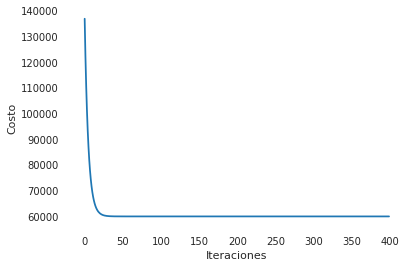

In [120]:

plt.figure()
plt.plot(np.arange(num_iterst), J_historyt)
plt.xlabel('Iteraciones')
plt.ylabel('Costo')
plt.show()

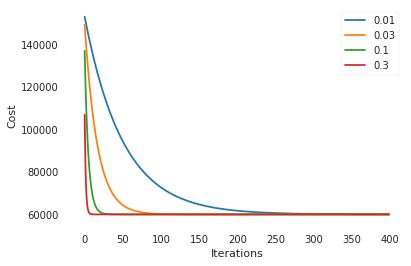

In [121]:
#se comprueba el costo para diferentes alpha
alphast = [0.01, 0.03, 0.1, 0.3]
plt.figure()
for alphat in alphast:
    thetat = np.zeros(4)
    num_iterst = 400
    thetat, J_historyt = gradientDescentMulti(X_traint, y, thetat, alphat, num_iterst)
    plt.plot(np.arange(num_iterst), J_historyt, label=str(alphat))
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.legend()
plt.show()

In [122]:

def predict(x,theta):
    """
    Toma una gran variedad de x y theta y devuelve el valor predicho de y basado en theta
    """
    
    predictions= np.dot(theta.transpose() ,x)
    
    return predictions


In [123]:
#se compara la prediccion con el % respento a la variable original
i=0
prediccioness= np.zeros(26)
for dato in X_traint:
  predict2=predict(np.array(dato),thetat)
  prediccioness[i]= predict2
  print(i,"cantidad retirados "+str(round(predict2,0)),'/','%', (round(predict2,0)*100)/y[i])
  i= i +1


0 cantidad retirados 687.0 / % 32.35986811116345
1 cantidad retirados 725.0 / % 101.68302945301542
2 cantidad retirados 335.0 / % 83.33333333333333
3 cantidad retirados 595.0 / % 1025.8620689655172
4 cantidad retirados 351.0 / % 3190.909090909091
5 cantidad retirados 690.0 / % 159.72222222222223
6 cantidad retirados 211.0 / % 680.6451612903226
7 cantidad retirados 450.0 / % 11250.0
8 cantidad retirados 479.0 / % 164.04109589041096
9 cantidad retirados 246.0 / % 206.72268907563026
10 cantidad retirados 834.0 / % 94.23728813559322
11 cantidad retirados 285.0 / % 101.42348754448399
12 cantidad retirados 373.0 / % 140.75471698113208
13 cantidad retirados 116.0 / % 54.205607476635514
14 cantidad retirados 365.0 / % 113.35403726708074
15 cantidad retirados 24.0 / % 15.286624203821656
16 cantidad retirados 276.0 / % 152.48618784530387
17 cantidad retirados 246.0 / % 82.0
18 cantidad retirados 604.0 / % 103.42465753424658
19 cantidad retirados 250.0 / % 92.5925925925926
20 cantidad retirados 5

In [124]:
rmse = mean_squared_error(y,prediccioness)
print("El error (rmse) de test es: ", rmse)

El error (rmse) de test es:  119823.33295894194


##Sin PCA

In [125]:
y =variable_objetivo['CANTIDAD TOTAL DE RETIRADOS'] #se guardan los datos de la varible objetivo

In [126]:
def featureNormalize(X):
    mu = np.mean(X, axis=0)
    sigma = np.std(X, ddof=1, axis=0)
    X_norm = (X - mu) / sigma
    return X_norm, mu, sigma

In [127]:

X_traint, mu, sigma = featureNormalize(X_std)
X_traint = np.hstack((np.ones((X_traint.shape[0],1)), X_traint))

Gradiente


In [128]:

def computeCostMulti(X, y, theta):
    h = np.dot(X, theta) - y
    J = np.dot(h, h) / (2 * X.shape[0])
    return J

In [129]:

def gradientDescentMulti(X, y, theta, alpha, num_iters):
    J_history = np.zeros(num_iters)
    for i in range(num_iters):
        theta = (theta - (alpha / X.shape[0])* np.dot(X.T, (np.dot(X, theta) - y)))   
        J_history[i] = computeCostMulti(X, y, theta)
    return theta, J_history

In [130]:
#se obtienen los datos de thetat, y J_history
thetat = np.zeros(15)
alphat = 0.1
num_iterst = 400
thetat, J_historyt = gradientDescentMulti(X_traint, y, thetat, alphat, num_iterst)
print(thetat)
print(J_historyt[0])

[ 378.26923077 -277.79231899  375.05491856  -11.59766362   27.08462842
   94.83145557   92.69337052 -190.08009982  267.20111066  318.22284013
 -237.92666378   -6.31273002    6.95917787  -91.10316496  296.24302783]
125749.69396116657


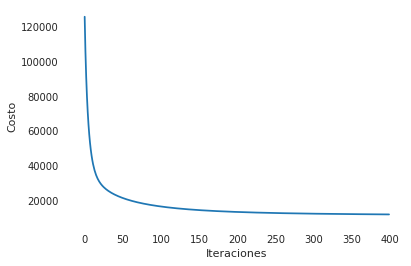

In [131]:

plt.figure()
plt.plot(np.arange(num_iterst), J_historyt)
plt.xlabel('Iteraciones')
plt.ylabel('Costo')
plt.show()

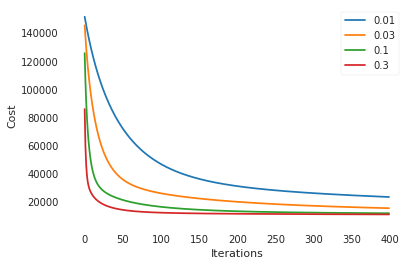

In [132]:
#se comprueba el costo para diferentes alpha
alphast = [0.01, 0.03, 0.1, 0.3]
plt.figure()
for alphat in alphast:
    thetat = np.zeros(15)
    num_iterst = 400
    thetat, J_historyt = gradientDescentMulti(X_traint, y, thetat, alphat, num_iterst)
    plt.plot(np.arange(num_iterst), J_historyt, label=str(alphat))
plt.xlabel('Iterations')
plt.ylabel('Cost')
plt.legend()
plt.show()

In [133]:

def predict(x,theta):
    """
    Toma una gran variedad de x y theta y devuelve el valor predicho de y basado en theta
    """
    
    predictions= np.dot(theta.transpose() ,x)
    
    return predictions


In [134]:
#se compara la prediccion con el % respento a la variable original
i=0
prediccioness= np.zeros(26)
for dato in X_traint:
  predict2=predict(np.array(dato),thetat)
  prediccioness[i]= predict2
  print(i,"cantidad retirados "+str(round(predict2,0)),'/','%', (round(predict2,0)*100)/y[i])
  i= i +1


0 cantidad retirados 1928.0 / % 90.81488459726802
1 cantidad retirados 537.0 / % 75.31556802244039
2 cantidad retirados 384.0 / % 95.5223880597015
3 cantidad retirados 33.0 / % 56.89655172413793
4 cantidad retirados 232.0 / % 2109.090909090909
5 cantidad retirados 578.0 / % 133.7962962962963
6 cantidad retirados 319.0 / % 1029.032258064516
7 cantidad retirados 70.0 / % 1750.0
8 cantidad retirados 147.0 / % 50.342465753424655
9 cantidad retirados 150.0 / % 126.05042016806723
10 cantidad retirados 904.0 / % 102.14689265536722
11 cantidad retirados 320.0 / % 113.87900355871886
12 cantidad retirados 470.0 / % 177.35849056603774
13 cantidad retirados 327.0 / % 152.80373831775702
14 cantidad retirados 204.0 / % 63.35403726708075
15 cantidad retirados 15.0 / % 9.554140127388536
16 cantidad retirados 391.0 / % 216.02209944751382
17 cantidad retirados 300.0 / % 100.0
18 cantidad retirados 836.0 / % 143.15068493150685
19 cantidad retirados 278.0 / % 102.96296296296296
20 cantidad retirados 364.0

In [135]:
rmse = mean_squared_error(y,prediccioness)
print("El error (rmse) de test es: ", rmse)

El error (rmse) de test es:  22230.094606176965


# Árbol de decisión






## Division de datos de entrenamiento y datos de prueba




In [136]:
# se dividen los datos de prueba y entrenamiento
X_train, X_test, y_train, y_test = train_test_split(X_std,X_stdo,random_state = 123)

##Profundidad 3

In [137]:
#se define el modelo del arbol de profundidad 3
modelo = DecisionTreeRegressor( 
            max_depth         = 3,
            random_state = 123
          )

In [138]:
modelo.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=3,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=123, splitter='best')

Profundidad del árbol: 3
Número de nodos terminales: 5


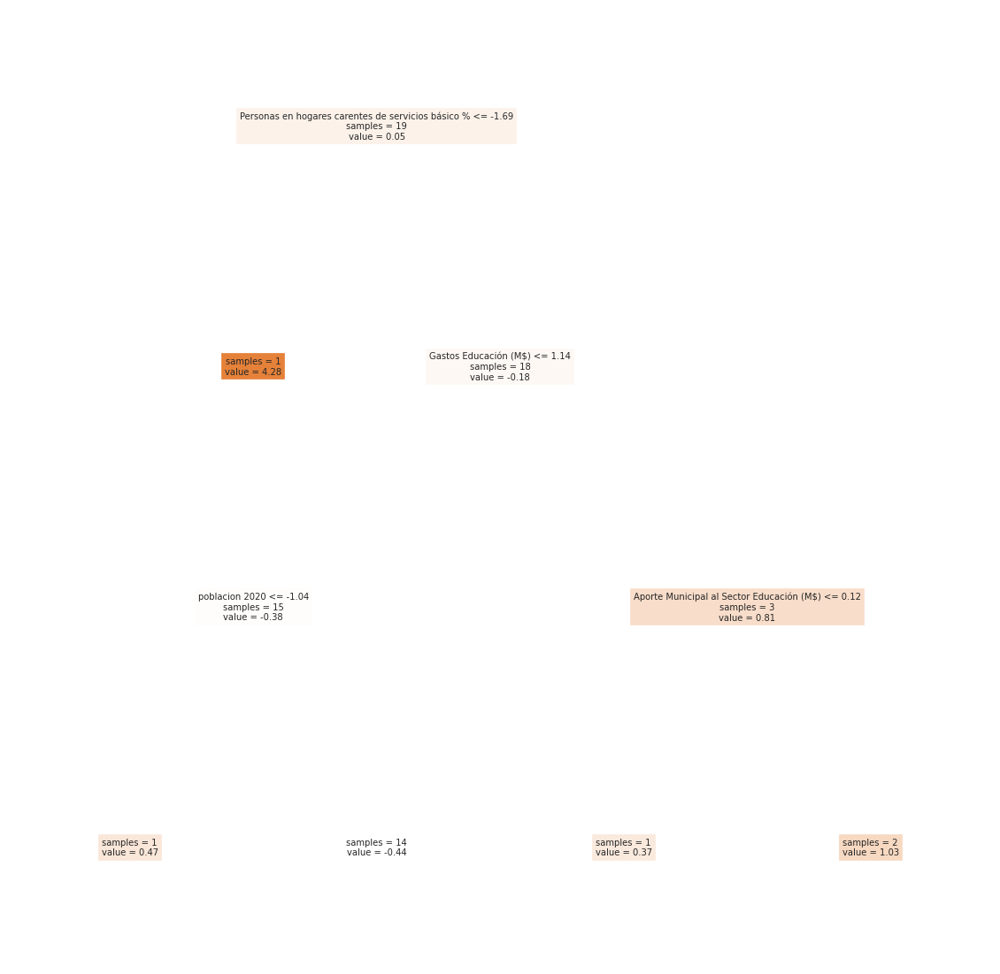

In [139]:
#se grafica el arbol
fig, ax = plt.subplots(figsize=(20, 20))

print(f"Profundidad del árbol: {modelo.get_depth()}")
print(f"Número de nodos terminales: {modelo.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo,
            feature_names = variables_independientes.columns,
            class_names   = 'CANTIDAD TOTAL DE RETIRADOS',
            filled        = True,
            impurity      = False,
            fontsize      = 10,
            precision     = 2,
            ax            = ax
       )

In [140]:
texto_modelo = export_text(# se obtinen los textos del arbol
                    decision_tree = modelo,
                    feature_names = list(variables_independientes.columns)
               )
print(texto_modelo)

|--- Personas en hogares carentes de servicios básico % <= -1.69
|   |--- value: [4.28]
|--- Personas en hogares carentes de servicios básico % >  -1.69
|   |--- Gastos Educación (M$) <= 1.14
|   |   |--- poblacion 2020 <= -1.04
|   |   |   |--- value: [0.47]
|   |   |--- poblacion 2020 >  -1.04
|   |   |   |--- value: [-0.44]
|   |--- Gastos Educación (M$) >  1.14
|   |   |--- Aporte Municipal al Sector Educación (M$) <= 0.12
|   |   |   |--- value: [0.37]
|   |   |--- Aporte Municipal al Sector Educación (M$) >  0.12
|   |   |   |--- value: [1.03]



In [141]:
importancia_predictores = pd.DataFrame( # se obtiene la importancion de cada predictor utilizado en el arbol
                            {'predictor': variables_independientes.columns,
                             'importancia': modelo.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
3,Personas en hogares carentes de servicios bási...,0.802594
11,Gastos Educación (M$),0.152141
1,poblacion 2020,0.033016
10,Aporte Municipal al Sector Educación (M$),0.012250
0,Superficie km2,0.000000
2,tasa de pobreza por ingresos %,0.000000
4,Hogares hacinados %,0.000000
5,cantidad de establecimientos municipales,0.000000
6,cantidad de establecimientos particular subven...,0.000000
7,cantidad de establecimientos particular pagado,0.000000


In [142]:
predicciones = modelo.predict(X = X_test)

rmse = mean_squared_error(
        y_true  = y_test,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 0.3646249140957541


In [143]:
acc_decision_test = round(modelo.score(X_test, y_test) * 100, 2) #se obtiene la precision de los datos
print("precisión: ",acc_decision_test, "%")

precisión:  19.58 %


In [144]:
acc_decision_train = round(modelo.score(X_train, y_train) * 100, 2) #se obtiene la precision de los datos
print("precisión: ",acc_decision_train, "%")

precisión:  95.21 %


Los codigos para los arboles de profundidad 4 y 5 son los mismos que los anteriores


##Profundidad 4

In [145]:
modelo4 = DecisionTreeRegressor(
            max_depth         = 4,
            random_state = 123
          )

In [146]:
modelo4.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=4,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=123, splitter='best')

Profundidad del árbol: 4
Número de nodos terminales: 7


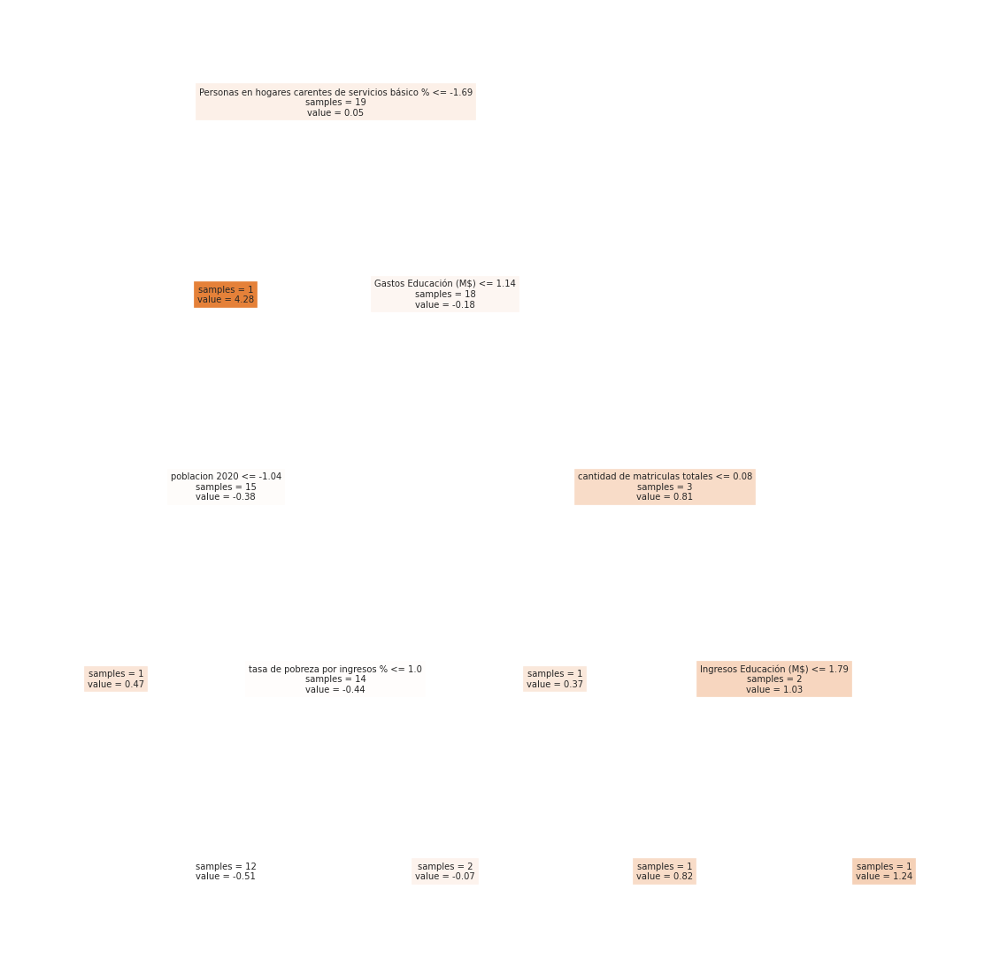

In [147]:
fig, ax = plt.subplots(figsize=(20, 20))

print(f"Profundidad del árbol: {modelo4.get_depth()}")
print(f"Número de nodos terminales: {modelo4.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo4,
            feature_names = variables_independientes.columns,
            class_names   = 'CANTIDAD TOTAL DE RETIRADOS',
            filled        = True,
            impurity      = False,
            fontsize      = 10,
            precision     = 2,
            ax            = ax
       )

In [148]:
texto_modelo4 = export_text(
                    decision_tree = modelo4,
                    feature_names = list(variables_independientes.columns)
               )
print(texto_modelo4)

|--- Personas en hogares carentes de servicios básico % <= -1.69
|   |--- value: [4.28]
|--- Personas en hogares carentes de servicios básico % >  -1.69
|   |--- Gastos Educación (M$) <= 1.14
|   |   |--- poblacion 2020 <= -1.04
|   |   |   |--- value: [0.47]
|   |   |--- poblacion 2020 >  -1.04
|   |   |   |--- tasa de pobreza por ingresos % <= 1.00
|   |   |   |   |--- value: [-0.51]
|   |   |   |--- tasa de pobreza por ingresos % >  1.00
|   |   |   |   |--- value: [-0.07]
|   |--- Gastos Educación (M$) >  1.14
|   |   |--- cantidad de matriculas totales <= 0.08
|   |   |   |--- value: [0.37]
|   |   |--- cantidad de matriculas totales >  0.08
|   |   |   |--- Ingresos Educación (M$) <= 1.79
|   |   |   |   |--- value: [0.82]
|   |   |   |--- Ingresos Educación (M$) >  1.79
|   |   |   |   |--- value: [1.24]



In [149]:
importancia_predictores = pd.DataFrame(
                            {'predictor': variables_independientes.columns,
                             'importancia': modelo4.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
3,Personas en hogares carentes de servicios bási...,0.788469
11,Gastos Educación (M$),0.149463
1,poblacion 2020,0.032435
2,tasa de pobreza por ingresos %,0.013882
8,cantidad de matriculas totales,0.012034
9,Ingresos Educación (M$),0.003718
0,Superficie km2,0.000000
4,Hogares hacinados %,0.000000
5,cantidad de establecimientos municipales,0.000000
6,cantidad de establecimientos particular subven...,0.000000


In [150]:
predicciones = modelo4.predict(X = X_test)

rmse = mean_squared_error(
        y_true  = y_test,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 0.3851008579098669


In [151]:
acc_decision_test = round(modelo4.score(X_test, y_test) * 100, 2) #se obtiene la precision de los datos
print("precisión: ",acc_decision_test, "%")

precisión:  10.3 %


In [152]:
acc_decision_train = round(modelo4.score(X_train, y_train) * 100, 2) #se obtiene la precision de los datos
print("precisión: ",acc_decision_train, "%")

precisión:  96.92 %


##Profundidad 4 con adaboost

In [153]:
#se utiliza adaboost para la mejora de la prediccion con un arbol de profundidad 4
regr_2 = AdaBoostRegressor(DecisionTreeRegressor(max_depth=4), 
                          n_estimators=300, random_state=123)


In [154]:
regr_2.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


AdaBoostRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                       criterion='mse',
                                                       max_depth=4,
                                                       max_features=None,
                                                       max_leaf_nodes=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                                       min_weight_fraction_leaf=0.0,
                                                       presort='deprecated',
                                                       random_state=None,
                                                       splitter='best'),
                  

In [155]:
importancia_predictores = pd.DataFrame(
                            {'predictor': variables_independientes.columns,
                             'importancia': regr_2.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
3,Personas en hogares carentes de servicios bási...,0.209915
13,tasa de denuncias por violencia intrafamiliar,0.178157
8,cantidad de matriculas totales,0.144179
6,cantidad de establecimientos particular subven...,0.136183
11,Gastos Educación (M$),0.111851
7,cantidad de establecimientos particular pagado,0.065706
1,poblacion 2020,0.045232
9,Ingresos Educación (M$),0.032011
2,tasa de pobreza por ingresos %,0.016867
4,Hogares hacinados %,0.014332


In [156]:
predicciones = regr_2.predict(X = X_test)

rmse = mean_squared_error(
        y_true  = y_test,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 0.3815714399682832


In [157]:
acc_decision_test = round(regr_2.score(X_test, y_test) * 100, 2) #se obtiene la precision de los datos
print("precisión: ",acc_decision_test, "%")

precisión:  11.93 %


In [158]:
acc_decision_train = round(regr_2.score(X_train, y_train) * 100, 2) #se obtiene la precision de los datos
print("precisión: ",acc_decision_train, "%")

precisión:  99.21 %


##Profundidad 5

In [159]:
modelo5 = DecisionTreeRegressor(
            max_depth         = 5,
            random_state = 123
          )

In [160]:
modelo5.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=5,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=123, splitter='best')

Profundidad del árbol: 5
Número de nodos terminales: 9


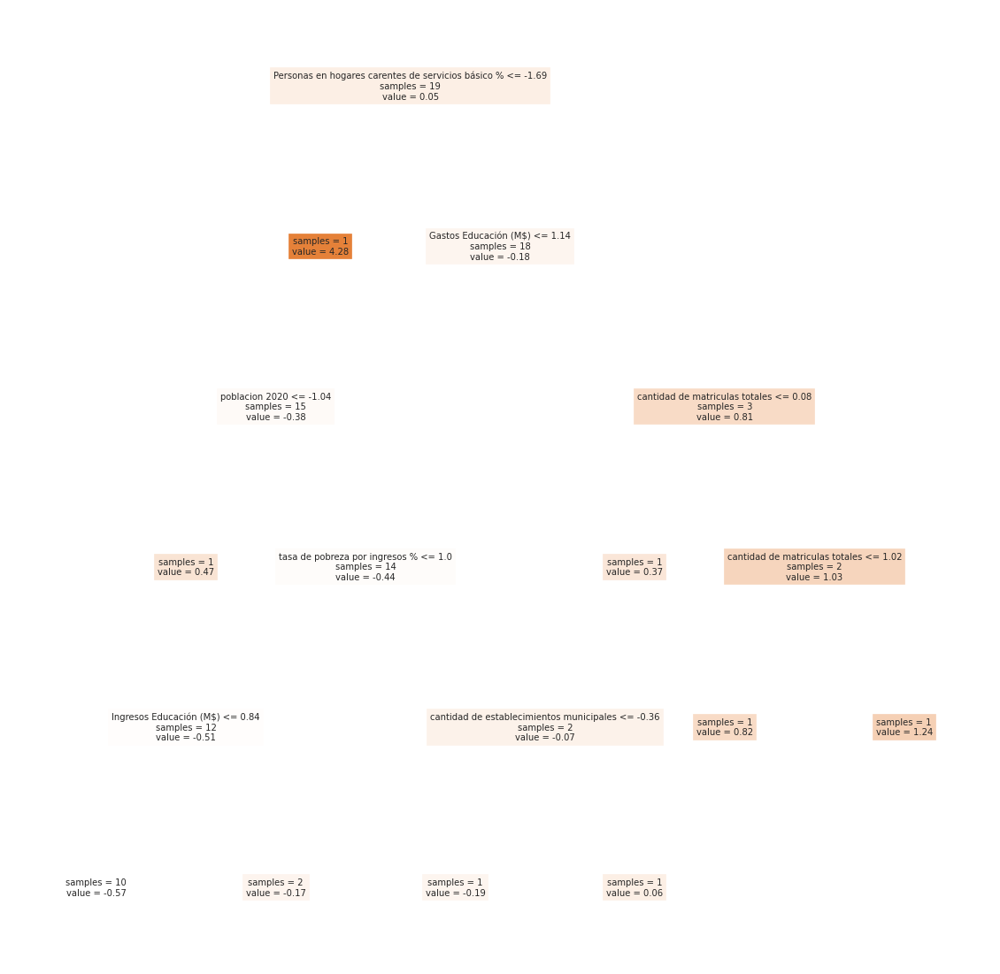

In [161]:
fig, ax = plt.subplots(figsize=(20, 20))

print(f"Profundidad del árbol: {modelo5.get_depth()}")
print(f"Número de nodos terminales: {modelo5.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo5,
            feature_names = variables_independientes.columns,
            class_names   = 'CANTIDAD TOTAL DE RETIRADOS',
            filled        = True,
            impurity      = False,
            fontsize      = 10,
            precision     = 2,
            ax            = ax
       )

In [162]:
texto_modelo5 = export_text(
                    decision_tree = modelo5,
                    feature_names = list(variables_independientes.columns)
               )
print(texto_modelo5)

|--- Personas en hogares carentes de servicios básico % <= -1.69
|   |--- value: [4.28]
|--- Personas en hogares carentes de servicios básico % >  -1.69
|   |--- Gastos Educación (M$) <= 1.14
|   |   |--- poblacion 2020 <= -1.04
|   |   |   |--- value: [0.47]
|   |   |--- poblacion 2020 >  -1.04
|   |   |   |--- tasa de pobreza por ingresos % <= 1.00
|   |   |   |   |--- Ingresos Educación (M$) <= 0.84
|   |   |   |   |   |--- value: [-0.57]
|   |   |   |   |--- Ingresos Educación (M$) >  0.84
|   |   |   |   |   |--- value: [-0.17]
|   |   |   |--- tasa de pobreza por ingresos % >  1.00
|   |   |   |   |--- cantidad de establecimientos municipales <= -0.36
|   |   |   |   |   |--- value: [-0.19]
|   |   |   |   |--- cantidad de establecimientos municipales >  -0.36
|   |   |   |   |   |--- value: [0.06]
|   |--- Gastos Educación (M$) >  1.14
|   |   |--- cantidad de matriculas totales <= 0.08
|   |   |   |--- value: [0.37]
|   |   |--- cantidad de matriculas totales >  0.08
|   |   | 

In [163]:
importancia_predictores = pd.DataFrame(
                            {'predictor': variables_independientes.columns,
                             'importancia': modelo5.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
3,Personas en hogares carentes de servicios bási...,0.778572
11,Gastos Educación (M$),0.147587
1,poblacion 2020,0.032028
8,cantidad de matriculas totales,0.015554
2,tasa de pobreza por ingresos %,0.013707
9,Ingresos Educación (M$),0.011261
5,cantidad de establecimientos municipales,0.001291
0,Superficie km2,0.000000
4,Hogares hacinados %,0.000000
6,cantidad de establecimientos particular subven...,0.000000


In [164]:
predicciones = modelo5.predict(X = X_test)

rmse = mean_squared_error(
        y_true  = y_test,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 0.42837986029990427


In [165]:
acc_decision_test = round(modelo5.score(X_test, y_test) * 100, 2) #se obtiene la precision de los datos
print("precisión: ",acc_decision_test, "%")

precisión:  -11.0 %


In [166]:
acc_decision_train = round(modelo5.score(X_train, y_train) * 100, 2) #se obtiene la precision de los datos
print("precisión: ",acc_decision_train, "%")

precisión:  98.15 %


##Random forest

In [167]:
#se dividen los datos en entrenamiento y prueba
X_trainf, X_testf, y_trainf, y_testf = train_test_split( 
                                        X_std,
                                        X_stdo,
                                        random_state = 123
                                    )

modelof = RandomForestRegressor(
            n_estimators = 10,
            criterion    = 'mse',
            max_depth    = None,
            max_features = 'auto',
            oob_score    = False,
            n_jobs       = -1,
            random_state = 123
         )

modelof.fit(X_trainf, y_trainf)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=10, n_jobs=-1, oob_score=False,
                      random_state=123, verbose=0, warm_start=False)

In [168]:
predicciones = modelof.predict(X = X_testf)

rmse = mean_squared_error(
        y_true  = y_testf,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 0.5582347668583799


In [169]:
acc_decision_test = round(modelof.score(X_test, y_test) * 100, 2) #se obtiene la precision de los datos
print(acc_decision_test)

-88.5


In [170]:
acc_decision_train = round(modelof.score(X_train, y_train) * 100, 2) #se obtiene la precision de los datos
print(acc_decision_train)

85.07


###Mejora de random forest

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_forest.py:815: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  app.launch_new_instance()
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_forest.py:815: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/usr

Valor óptimo de n_estimators: 26


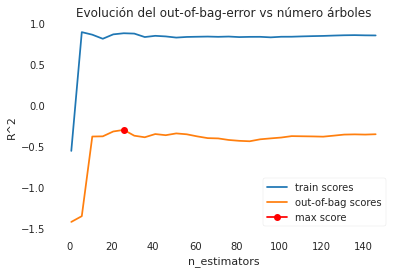

In [171]:
train_scores = []#se obtiene el valor optimo de estimadores
oob_scores   = []

estimator_range = range(1, 150, 5)

for n_estimators in estimator_range:
    modelof = RandomForestRegressor(
                n_estimators = n_estimators,
                criterion    = 'mse',
                max_depth    = None,
                max_features = 'auto',
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123
             )
    modelof.fit(X_trainf, y_trainf)
    train_scores.append(modelof.score(X_trainf, y_trainf))
    oob_scores.append(modelof.oob_score_)
    
fig, ax = plt.subplots(figsize=(6, 3.84))
ax.plot(estimator_range, train_scores, label="train scores")
ax.plot(estimator_range, oob_scores, label="out-of-bag scores")
ax.plot(estimator_range[np.argmax(oob_scores)], max(oob_scores),
        marker='o', color = "red", label="max score")
ax.set_ylabel("R^2")
ax.set_xlabel("n_estimators")
ax.set_title("Evolución del out-of-bag-error vs número árboles")
plt.legend();
print(f"Valor óptimo de n_estimators: {estimator_range[np.argmax(oob_scores)]}")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed whe

Valor óptimo de n_estimators: 1


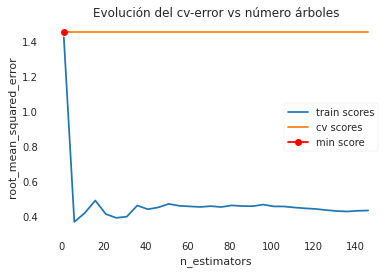

In [172]:
train_scores = []
cv_scores    = []


estimator_range = range(1, 150, 5)

for n_estimators in estimator_range:
    
    modelof = RandomForestRegressor(
                n_estimators = n_estimators,
                criterion    = 'mse',
                max_depth    = None,
                max_features = 'auto',
                oob_score    = False,
                n_jobs       = -1,
                random_state = 123
             )
    
    # Error de train
    modelof.fit(X_trainf, y_trainf)
    predicciones = modelof.predict(X = X_trainf)
    rmse = mean_squared_error(
            y_true  = y_trainf,
            y_pred  = predicciones,
            squared = False
           )
    train_scores.append(rmse)
    
    scores = cross_val_score(
                estimator = modelo,
                X         = X_trainf,
                y         = y_trainf,
                scoring   = 'neg_root_mean_squared_error',
                cv        = 5
             )

    cv_scores.append(-1*scores.mean())
    

fig, ax = plt.subplots(figsize=(6, 3.84))
ax.plot(estimator_range, train_scores, label="train scores")
ax.plot(estimator_range, cv_scores, label="cv scores")
ax.plot(estimator_range[np.argmin(cv_scores)], min(cv_scores),
        marker='o', color = "red", label="min score")
ax.set_ylabel("root_mean_squared_error")
ax.set_xlabel("n_estimators")
ax.set_title("Evolución del cv-error vs número árboles")
plt.legend();
print(f"Valor óptimo de n_estimators: {estimator_range[np.argmin(cv_scores)]}")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: DataConversionWarning: A column-vector y was passed whe

Valor óptimo de max_features: 1


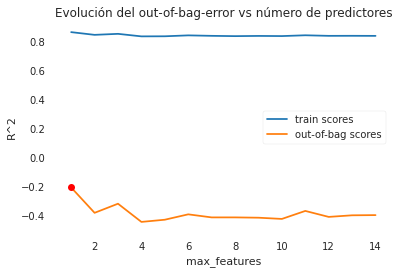

In [173]:
train_scores = []#numero optimo de carecteristicas
oob_scores   = []


max_features_range = range(1, X_trainf.shape[1] + 1, 1)


for max_features in max_features_range:
    modelof = RandomForestRegressor(
                n_estimators = 100,
                criterion    = 'mse',
                max_depth    = None,
                max_features = max_features,
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123
             )
    modelof.fit(X_trainf, y_trainf)
    train_scores.append(modelof.score(X_trainf, y_trainf))
    oob_scores.append(modelof.oob_score_)
    

fig, ax = plt.subplots(figsize=(6, 3.84))
ax.plot(max_features_range, train_scores, label="train scores")
ax.plot(max_features_range, oob_scores, label="out-of-bag scores")
ax.plot(max_features_range[np.argmax(oob_scores)], max(oob_scores),
        marker='o', color = "red")
ax.set_ylabel("R^2")
ax.set_xlabel("max_features")
ax.set_title("Evolución del out-of-bag-error vs número de predictores")
plt.legend();
print(f"Valor óptimo de max_features: {max_features_range[np.argmax(oob_scores)]}")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,

Valor óptimo de max_features: 1


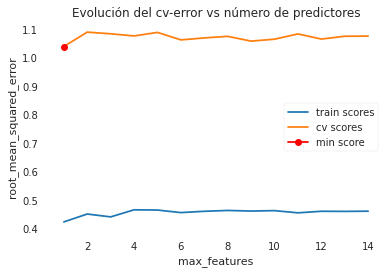

In [174]:
train_scores = []
cv_scores    = []


max_features_range = range(1, X_trainf.shape[1] + 1, 1)


for max_features in max_features_range:
    
    modelof = RandomForestRegressor(
                n_estimators = 100,
                criterion    = 'mse',
                max_depth    = None,
                max_features = max_features,
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123
             )
    

    modelof.fit(X_trainf, y_trainf)
    predicciones = modelof.predict(X = X_trainf)
    rmse = mean_squared_error(
            y_true  = y_trainf,
            y_pred  = predicciones,
            squared = False
           )
    train_scores.append(rmse)
    

    scores = cross_val_score(
                estimator = modelof,
                X         = X_trainf,
                y         = y_trainf,
                scoring   = 'neg_root_mean_squared_error',
                cv        = 5
             )

    cv_scores.append(-1*scores.mean())

fig, ax = plt.subplots(figsize=(6, 3.84))
ax.plot(max_features_range, train_scores, label="train scores")
ax.plot(max_features_range, cv_scores, label="cv scores")
ax.plot(max_features_range[np.argmin(cv_scores)], min(cv_scores),
        marker='o', color = "red", label="min score")
ax.set_ylabel("root_mean_squared_error")
ax.set_xlabel("max_features")
ax.set_title("Evolución del cv-error vs número de predictores")
plt.legend();
print(f"Valor óptimo de max_features: {max_features_range[np.argmin(cv_scores)]}")

In [175]:
param_grid = ParameterGrid(# se prueban los datos para cada cantidad de caracteristicas y las profundidades
                {'n_estimators': [150],
                 'max_features': [5, 7, 9],
                 'max_depth'   : [None, 3, 10, 20]
                }
             )


resultados = {'params': [], 'oob_r2': []}

for params in param_grid:
    
    modelof = RandomForestRegressor(
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123,
                ** params
             )
    
    modelof.fit(X_trainf, y_trainf)
    
    resultados['params'].append(params)
    resultados['oob_r2'].append(modelof.oob_score_)
    print(f"Modelo: {params} \u2713")

resultados = pd.DataFrame(resultados)
resultados = pd.concat([resultados, resultados['params'].apply(pd.Series)], axis=1)
resultados = resultados.drop(columns = 'params')
resultados = resultados.sort_values('oob_r2', ascending=False)
resultados.head(4)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': None, 'max_features': 5, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': None, 'max_features': 7, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': None, 'max_features': 9, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': 3, 'max_features': 5, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': 3, 'max_features': 7, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': 3, 'max_features': 9, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': 10, 'max_features': 5, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': 10, 'max_features': 7, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': 10, 'max_features': 9, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': 20, 'max_features': 5, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': 20, 'max_features': 7, 'n_estimators': 150} ✓


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Modelo: {'max_depth': 20, 'max_features': 9, 'n_estimators': 150} ✓


,oob_r2,max_depth,max_features,n_estimators
5,-0.303375,3.0,9.0,150.0
3,-0.306429,3.0,5.0,150.0
4,-0.311035,3.0,7.0,150.0
0,-0.331393,NaN,5.0,150.0


In [176]:

print("--------------------------------------------")
print("Mejores hiperparámetros encontrados (oob-r2)")
print("--------------------------------------------")
print(resultados.iloc[0,0], ":", resultados.iloc[0,:]['oob_r2'], "R2")

--------------------------------------------
Mejores hiperparámetros encontrados (oob-r2)
--------------------------------------------
-0.3033749565016173 : -0.3033749565016173 R2


In [177]:
#se imprimen los primeros hiperparametros que se encuentran, con las diferentes variaciones
param_grid = {'n_estimators': [150],
              'max_features': [5, 7, 9],
              'max_depth'   : [None, 3, 10, 20]
             }


grid = GridSearchCV(
        estimator  = RandomForestRegressor(random_state = 123),
        param_grid = param_grid,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=5, n_repeats=3, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid.fit(X = X_trainf, y = y_trainf)


resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(4)

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:515: DataConversionWarning: A column-vector y was passed when a 

,param_max_depth,param_max_features,param_n_estimators,mean_test_score,std_test_score,mean_train_score,std_train_score
4,3,7,150,-1.001397,0.680709,-0.434744,0.113534
1,None,7,150,-1.003377,0.681263,-0.414057,0.111060
7,10,7,150,-1.003377,0.681263,-0.414057,0.111060
10,20,7,150,-1.003377,0.681263,-0.414057,0.111060


In [178]:

print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv)")
print("----------------------------------------")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

----------------------------------------
Mejores hiperparámetros encontrados (cv)
----------------------------------------
{'max_depth': 3, 'max_features': 7, 'n_estimators': 150} : -1.0013967474742094 neg_root_mean_squared_error


In [179]:

modelo_finalf = grid.best_estimator_
predicciones = modelof.predict(X = X_testf)
rmse = mean_squared_error(
        y_true  = y_testf,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 0.47715679352336093


In [180]:
importancia_predictores = pd.DataFrame(# se muestra la improtancia de cada predictor
                            {'predictor': b.drop(columns = "CANTIDAD TOTAL DE RETIRADOS").columns,
                             'importancia': modelof.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
6,cantidad de establecimientos particular subven...,0.171745
13,tasa de denuncias por violencia intrafamiliar,0.170907
3,Personas en hogares carentes de servicios bási...,0.159689
8,cantidad de matriculas totales,0.149135
11,Gastos Educación (M$),0.111109
1,poblacion 2020,0.081765
9,Ingresos Educación (M$),0.066077
0,Superficie km2,0.020802
10,Aporte Municipal al Sector Educación (M$),0.018522
4,Hogares hacinados %,0.016258


###Random forest mejorado

In [181]:
predicciones = modelo_finalf.predict(X_test)

rmse = mean_squared_error(
        y_true  = y_test,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 0.46247445937096154


In [182]:
acc_decision_test = round(modelo_finalf.score(X_test, y_test) * 100, 2) #se obtiene la precision de los datos
print(acc_decision_test)

-29.37


In [183]:
acc_decision_train = round(modelo_finalf.score(X_train, y_train) * 100, 2) #se obtiene la precision de los datos
print(acc_decision_train)

83.84


# Redes Bayesianas

In [184]:
X_trains, X_tests, y_trains, y_tests = train_test_split(variables_independientes, variable_objetivo['CANTIDAD TOTAL DE RETIRADOS'], test_size = 0.3)

In [185]:
clf_bayes = GaussianNB() #Definición del algoritmo
clf_bayes.fit(X_trains, y_trains) #Entrenamiento del algoritmo
Y_predicts = clf_bayes.predict(X_tests) #Predicción del target en base a los datos de prueba

In [186]:
rmse = mean_squared_error(y_tests,Y_predicts)
print("El error (rmse) de test es: ", rmse)

El error (rmse) de test es:  614852.0


In [187]:
#Calculo de la precisión del modelo
from sklearn.metrics import precision_score
from sklearn import metrics
precision_bayes = precision_score(y_tests, Y_predicts, average = 'micro')
print('Precisión del Modelo: ', precision_bayes)

Precisión del Modelo:  0.0


In [188]:
# Matriz de Confusión para Clasificador Bayessiano
matriz_bayes = metrics.confusion_matrix(y_tests, Y_predicts)
print('Matriz de Confusión Clasificador Bayessiano: ')
print(matriz_bayes)

Matriz de Confusión Clasificador Bayessiano: 
[[0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0]]


# SVM


##kernel RBF

In [189]:
# Kernel RBF
SVM_2 = svm.SVR(kernel='rbf')
SVM_2.fit(X_trains, y_trains)
prediccion =SVM_2.predict(X_tests)
precision_SVM2 = cross_val_score(SVM_2,X_tests,y_tests,cv=3)
print('Precisión Kernel RBF: ', precision_SVM2)
print( precision_SVM2.mean())

Precisión Kernel RBF:  [  -0.45901388   -1.12586693 -424.92331661]
-142.16939914310538


In [190]:
predicciones = SVM_2.predict(X_tests)

rmse = mean_squared_error(
        y_true  = y_tests,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 712.8639507981399


##kernel poly

In [191]:
# Kernel poly
SVM_3 = svm.SVR(kernel='poly')
SVM_3.fit(X_trains, y_trains)
prediccion =SVM_3.predict(X_tests)
precision_SVM3 = cross_val_score(SVM_3,X_tests,y_tests,cv=3)
print('Precisión Kernel poly: ', precision_SVM3)
print( precision_SVM3.mean())

Precisión Kernel poly:  [  -0.46080514   -1.18789131 -430.08876626]
-143.91248757084657


In [192]:
predicciones = SVM_3.predict(X_tests)

rmse = mean_squared_error(
        y_true  = y_tests,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 696.8053866617034


# Redes neuronales

In [193]:
!pip3 install tensorflow

In [194]:
!pip3 install keras

In [195]:
# Se define la base del modelo
def baseline_model():
	model = Sequential()
	model.add(Dense(13, input_dim=14, kernel_initializer='normal', activation='relu'))
	model.add(Dense(1, kernel_initializer='normal'))
	model.compile(loss='mean_squared_error', optimizer='adam')
	return model

In [196]:
# Se inicializa una semilla aleatoria
seed = 7
np.random.seed(seed)
estimator = KerasRegressor(build_fn=baseline_model, nb_epoch=150, batch_size=50)

In [197]:
# Para este caso, se trabajo con 20 correspondiente a k fold, y se procede con la validación cruzada
kfold = 20
scores = cross_val_score(estimator, X_std, X_stdo, cv=kfold)
print("Results: %.2f (%.2f) MSE" % (scores.mean(), scores.std()))

1/1 [==============================] - 0s 82ms/step - loss: 0.3405
Results: -0.68 (1.95) MSE


In [198]:
# Se realiza una predicción del variable objetivo como salida
lasso = linear_model.Lasso()
y_pred=cross_val_predict(lasso, X_std, variable_objetivo['CANTIDAD TOTAL DE RETIRADOS'], cv=kfold)

In [199]:
y_pred

array([ 508.90992936,  294.6428507 ,  229.1799172 ,  -11.86326162,
       1286.9489859 ,  605.83459571,  730.9557849 ,  214.24992162,
       -177.59466065,   65.79207488,  845.54291767,  326.24961349,
        697.4480245 ,  350.87866227,  -88.50602768, -536.44296419,
        571.61444816,  315.68753933, 1314.82041995,  268.49805087,
        152.89605393,   84.6010555 ,   39.37053521,  329.7869514 ,
        173.98119663,  -59.94982218])

In [200]:
rmse = mean_squared_error(
        y_true  = X_stdo,
        y_pred  = y_pred,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")


El error (rmse) de test es: 524.8639484096191
